In [ ]:
# Kullanacağımız Kütüphanaeleri Ekledim.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns

sns.set()

In [ ]:
# Dosya çok büyük olduğu için clone dan ilgili veriyi çekiyorum.

!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 24.68 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [ ]:
%ls nih/

densenet.hdf5  images_small/  pretrained_model.h5  test.csv  train-small.csv  valid-small.csv


In [ ]:
# CSV dosyasıdan veri cekiliyor. 1000 kayıt ve 16 kolondan oluşan bir veri setimiz var.
train_df = pd.read_csv("nih/train-small.csv")
# Print first 5 rows
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')

#İlk 20 veri satırını ekrana getiriyorum.
train_df.head(20)


There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0
5,00001232_002.png,1,1,0,0,1,0,0,0,1,0,0,1232,0,0,0
6,00017135_000.png,0,0,0,0,0,0,0,0,0,0,0,17135,0,0,0
7,00027235_000.png,0,0,0,0,0,0,0,0,0,0,0,27235,0,0,0
8,00014197_007.png,0,0,0,0,0,0,0,0,0,0,0,14197,0,0,0
9,00011584_002.png,0,0,0,0,0,0,0,0,0,0,0,11584,0,0,0


In [ ]:
# Info değeri ile DataFrame'deki toplam satır sayısını buluyorum.
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

In [ ]:
# Toplam kayıt sayımız 1000 ve bunun 928 tanesi benzer değil. Yani 72 tane kayıt tekarlı diyebiliriz.

print(f"The total patient ids are {train_df['PatientId'].count()}, from those the unique ids are {train_df['PatientId'].value_counts().shape[0]} ")

The total patient ids are 1000, from those the unique ids are 928 


In [ ]:
# Mükerrer PatientId'leri bulma kod rutinim. Buradan 72 kaydın tekrarlı oldugunu gorebiliyoruz.
duplicate_patients = train_df[train_df.duplicated(subset=['PatientId'])]

# Mükerrer PatientId'ler
print("\nMükerrer 'PatientId' Kayıtları:")
print(duplicate_patients)


Mükerrer 'PatientId' Kayıtları:
                Image  Atelectasis  Cardiomegaly  Consolidation  Edema  \
27   00012045_053.png            0             0              0      0   
207  00013111_098.png            0             0              0      0   
249  00006039_009.png            1             0              0      0   
258  00026505_000.png            0             0              0      0   
296  00020213_091.png            1             0              1      0   
..                ...          ...           ...            ...    ...   
964  00013003_038.png            1             0              0      0   
968  00003028_002.png            0             0              0      0   
985  00020213_003.png            0             0              1      0   
994  00027235_001.png            0             0              0      0   
996  00020113_005.png            0             0              0      0   

     Effusion  Emphysema  Fibrosis  Hernia  Infiltration  Mass  Nodule  \
27  

In [ ]:
# Ilgili Mukerrer kayıtlari sildirip satır sayımı 928 e dusuruyorum

train_df = train_df.drop_duplicates(subset=['PatientId'])

print(train_df)

                Image  Atelectasis  Cardiomegaly  Consolidation  Edema  \
0    00008270_015.png            0             0              0      0   
1    00029855_001.png            1             0              0      0   
2    00001297_000.png            0             0              0      0   
3    00012359_002.png            0             0              0      0   
4    00017951_001.png            0             0              0      0   
..                ...          ...           ...            ...    ...   
993  00019605_001.png            0             0              0      0   
995  00015869_010.png            0             0              0      0   
997  00019939_000.png            0             0              0      0   
998  00030496_000.png            0             0              0      0   
999  00012363_002.png            0             0              0      0   

     Effusion  Emphysema  Fibrosis  Hernia  Infiltration  Mass  Nodule  \
0           0          0         0   

In [ ]:
print(f"The total patient ids are {train_df['PatientId'].count()}, from those the unique ids are {train_df['PatientId'].value_counts().shape[0]} ")

The total patient ids are 928, from those the unique ids are 928 


In [ ]:
# İlgili kolonlar yazdırırılıyor ve sonrasında gereksiz olan 2 kolon bigisi siliniyor.

columns = train_df.keys()
columns = list(columns)
print(columns)

columns.remove('Image')
columns.remove('PatientId')
# Get the total classes
print(f"There are {len(columns)} columns of labels for these conditions: {columns}")

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']
There are 14 columns of labels for these conditions: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


In [ ]:
# Ornek sayıları bulunuyor.
for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

The class Atelectasis has 94 samples
The class Cardiomegaly has 19 samples
The class Consolidation has 27 samples
The class Edema has 16 samples
The class Effusion has 107 samples
The class Emphysema has 12 samples
The class Fibrosis has 14 samples
The class Hernia has 2 samples
The class Infiltration has 159 samples
The class Mass has 41 samples
The class Nodule has 51 samples
The class Pleural_Thickening has 18 samples
The class Pneumonia has 9 samples
The class Pneumothorax has 33 samples


Display Random Images


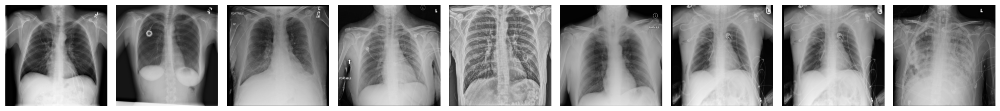

In [ ]:
# İlgili dosyadan resimleri cekiyorum
images = train_df['Image'].values

# Rastgele 9 tane goruntuyu , tekrar etmeyecek sekilde yazdırıyorum. ( Replace =False ile)
random_images = [np.random.choice(images, replace=False) for i in range(9)]

# Resimlerin lokasyonunu belirtiyorum.
img_dir = 'nih/images_small/'

# Resimlerin lokasyonunu belirtiyorum.
print('Display Random Images')

# Image in boyutlarını belirliyoruz.
plt.figure(figsize=(20,10))

# Yanyana 9 adet image rastgele getiriyoruz.
for i in range(9):
    plt.subplot(1, 9, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

plt.tight_layout()

Image 1: 00011971_007.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 0.9725 and the minimum is 0.0000
The mean value of the pixels is 0.4312 and the standard deviation is 0.2754
--------------------------------------------------


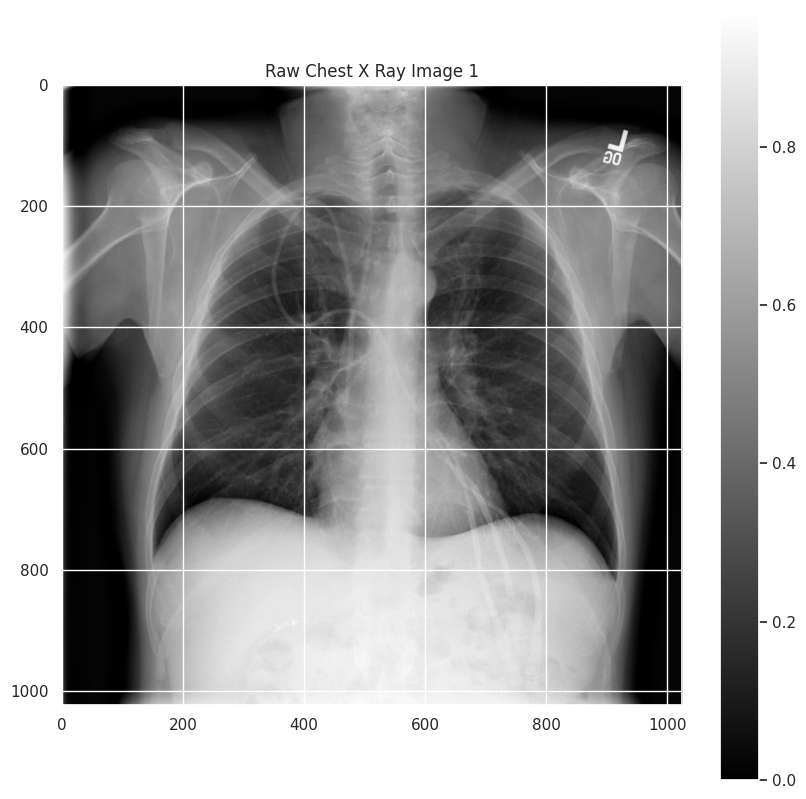

Image 2: 00017443_009.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.3975 and the standard deviation is 0.2372
--------------------------------------------------


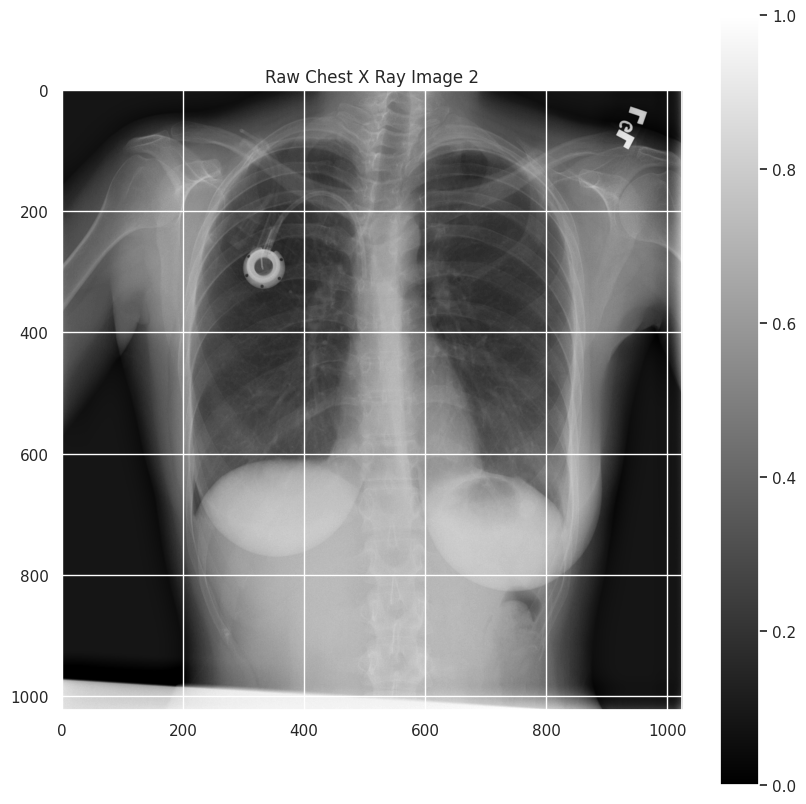

Image 3: 00025746_014.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4526 and the standard deviation is 0.2303
--------------------------------------------------


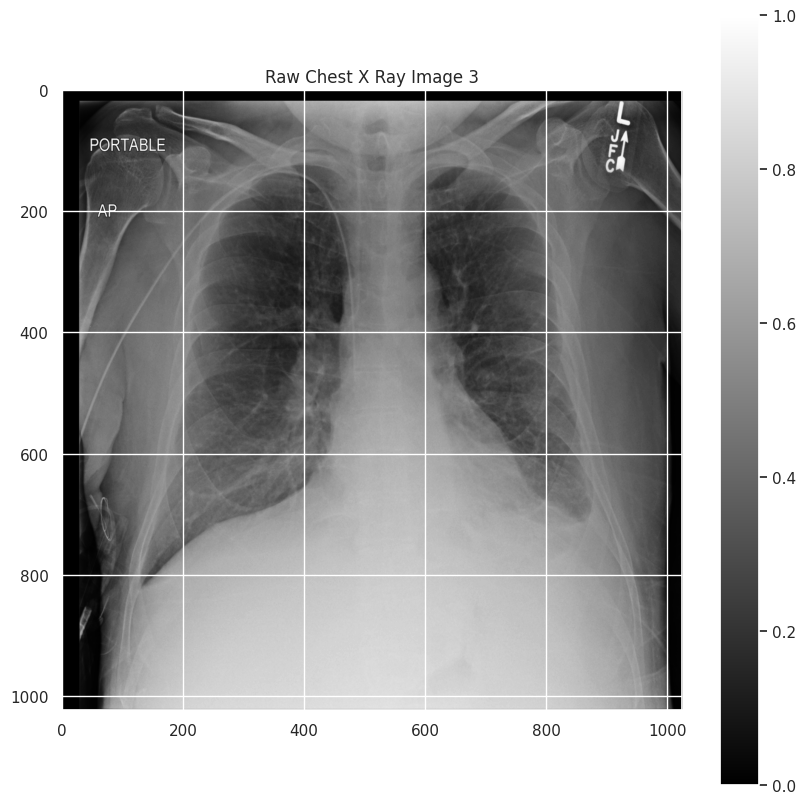

Image 4: 00003534_024.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4889 and the standard deviation is 0.2360
--------------------------------------------------


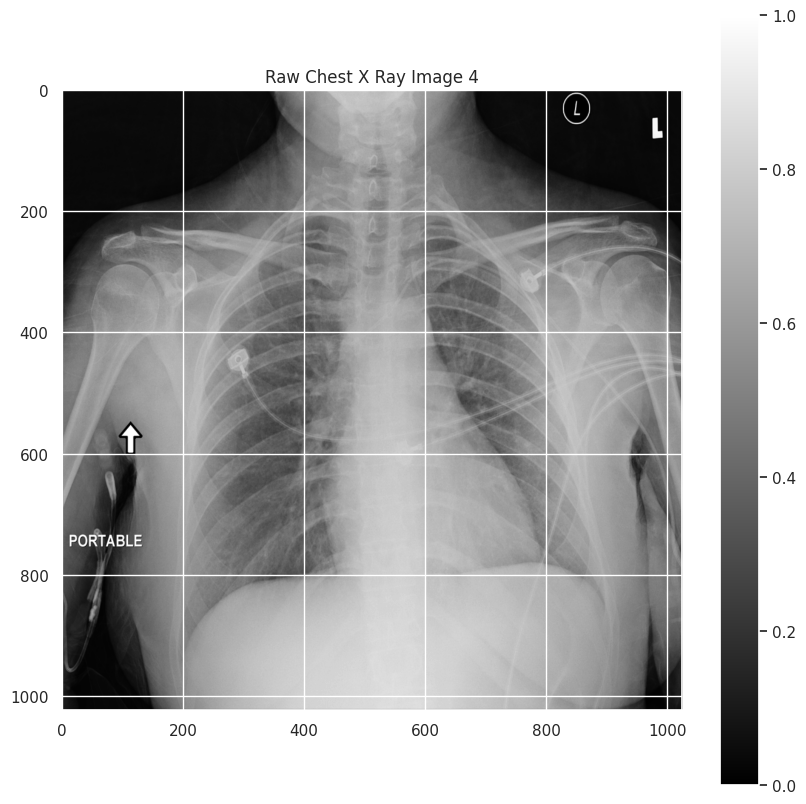

Image 5: 00026469_006.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.5785 and the standard deviation is 0.1589
--------------------------------------------------


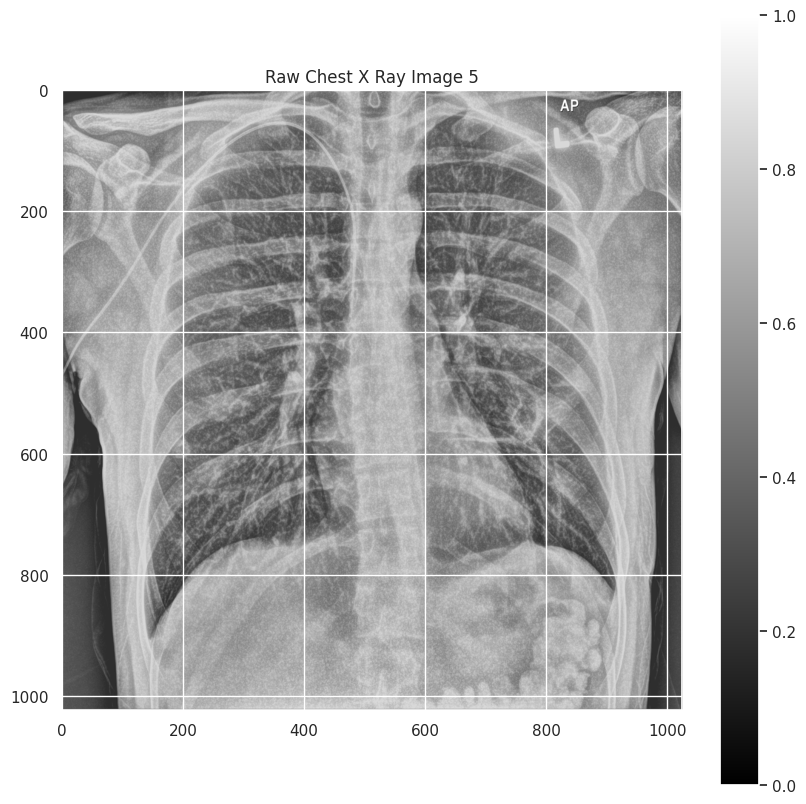

Image 6: 00012585_012.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4754 and the standard deviation is 0.2260
--------------------------------------------------


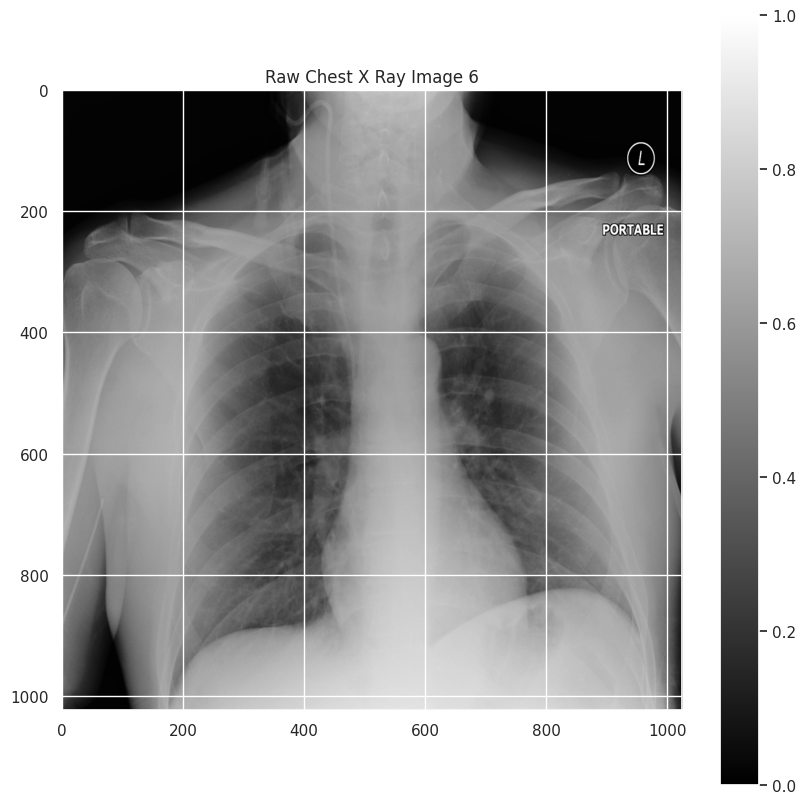

Image 7: 00008468_018.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 0.8078 and the minimum is 0.0000
The mean value of the pixels is 0.4232 and the standard deviation is 0.2142
--------------------------------------------------


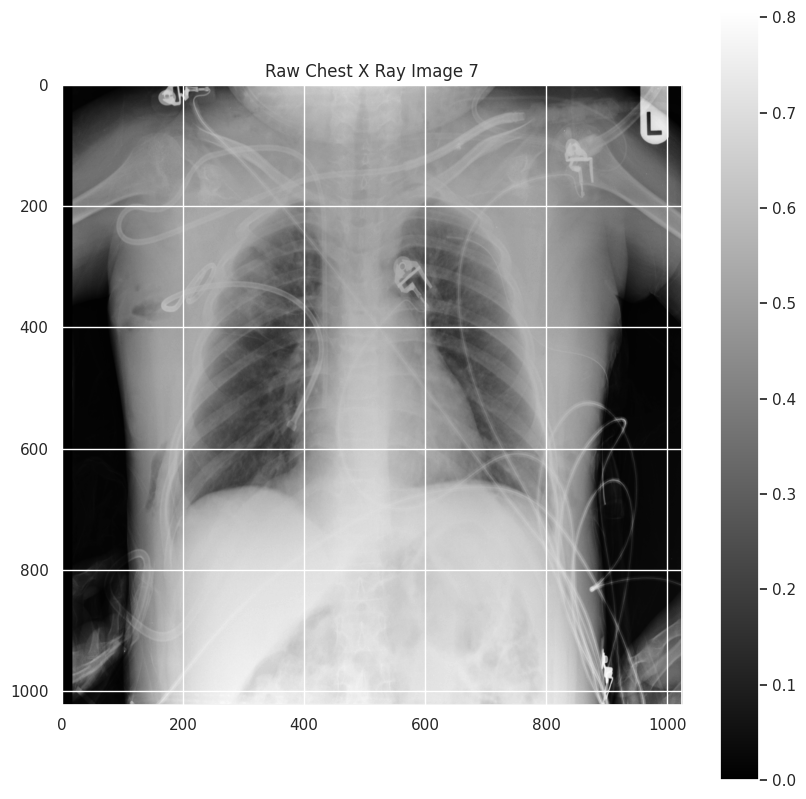

Image 8: 00008468_018.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 0.8078 and the minimum is 0.0000
The mean value of the pixels is 0.4232 and the standard deviation is 0.2142
--------------------------------------------------


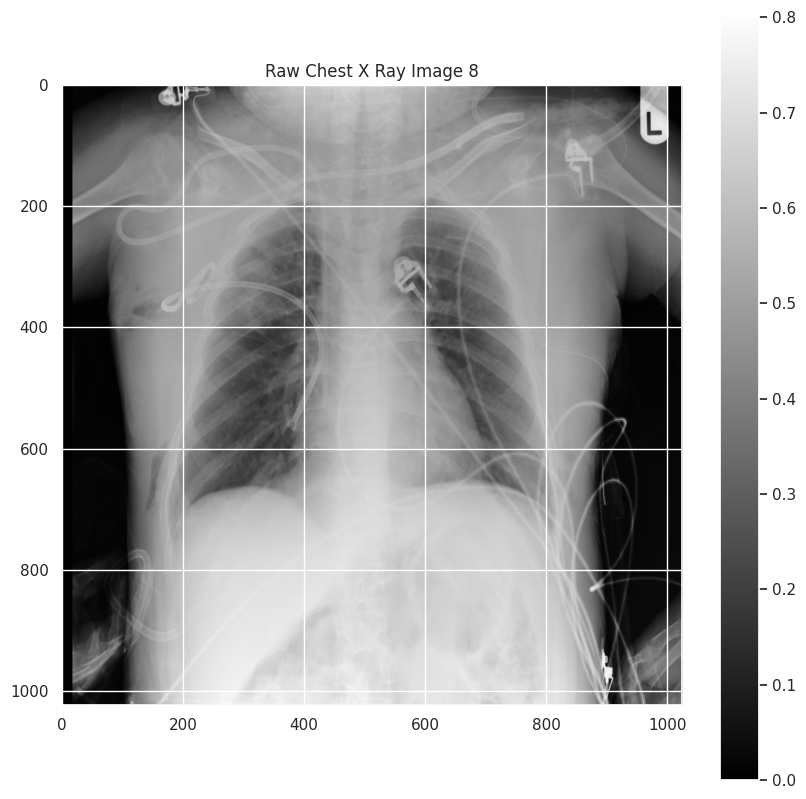

Image 9: 00026132_026.png
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4518 and the standard deviation is 0.2352
--------------------------------------------------


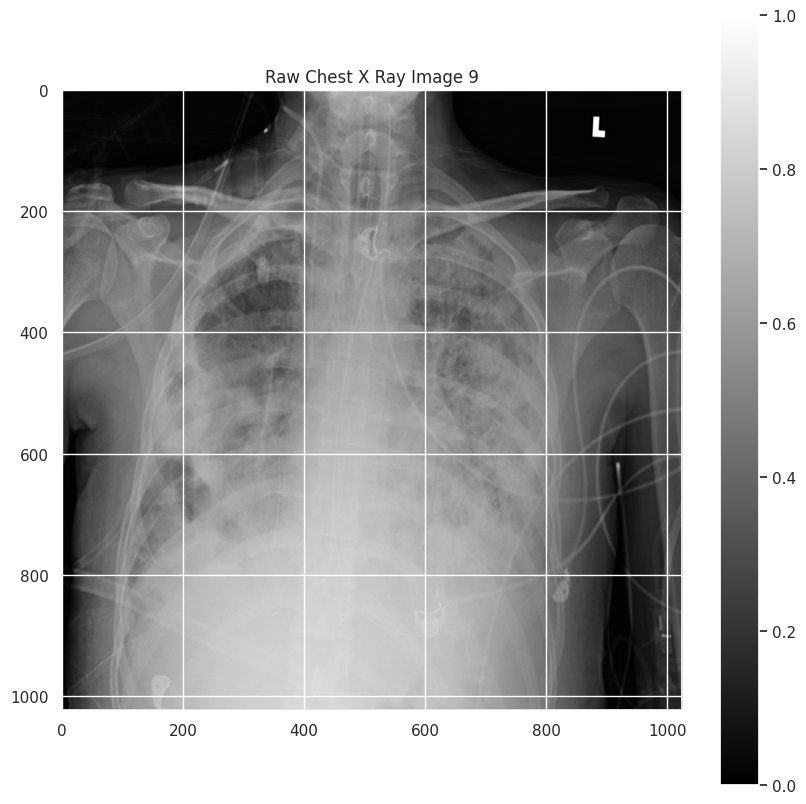

In [ ]:
# Rastgele yukarida aldigim 9 resmin istatiksel ozelliklerini buluyorum.

for i in range(9):
    sample_img = random_images[i]

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, sample_img))

    # Resmi görselleştir
    plt.figure(figsize=(10, 10))  # Her bir resim için figür boyutunu ayarlıyoruz
    plt.imshow(raw_image, cmap='gray')  # Gri tonlamada göster
    plt.colorbar()  # Renk skalasını ekle
    plt.title(f'Raw Chest X Ray Image {i+1}')

    # Resimle ilgili metrikler
    print(f"Image {i+1}: {sample_img}")
    print(f"The dimensions of the image are {raw_image.shape[0]} pixels width and {raw_image.shape[1]} pixels height, one single color channel")
    print(f"The maximum pixel value is {raw_image.max():.4f} and the minimum is {raw_image.min():.4f}")
    print(f"The mean value of the pixels is {raw_image.mean():.4f} and the standard deviation is {raw_image.std():.4f}")
    print('-' * 50)  # Ayırıcı çizgi

    # Görselleri göster
    plt.show()

<ipython-input-243-9dc80aa981fa>:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(raw_image.ravel(),


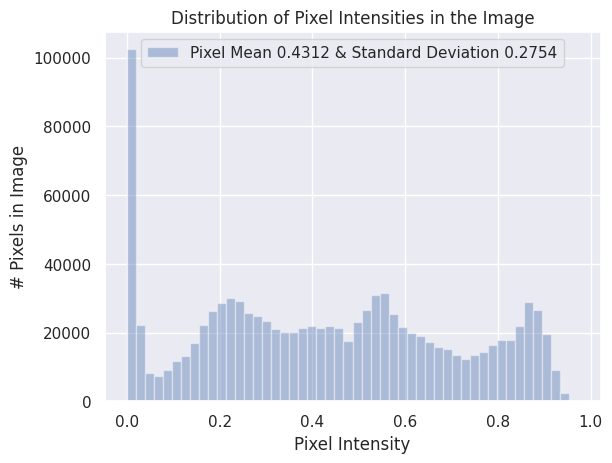

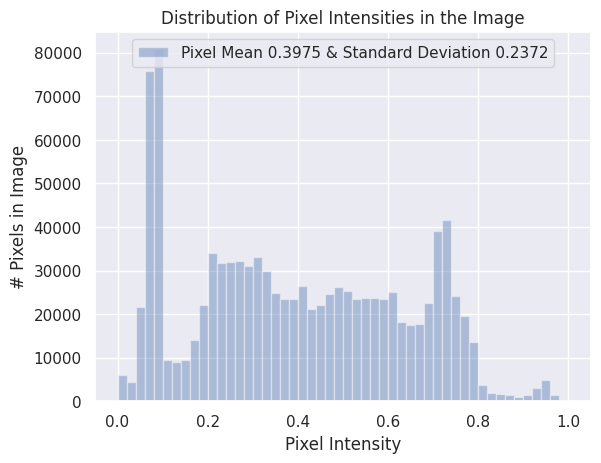

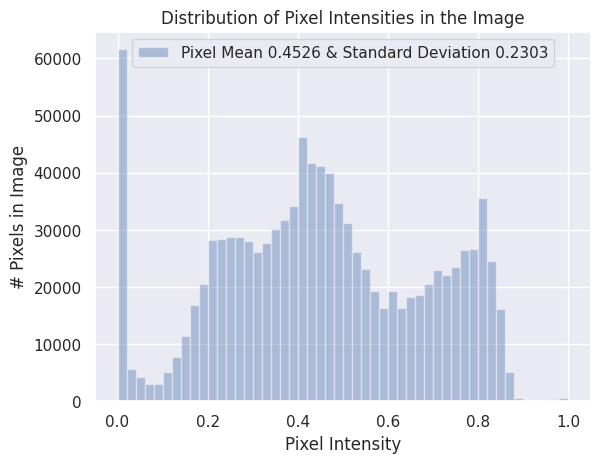

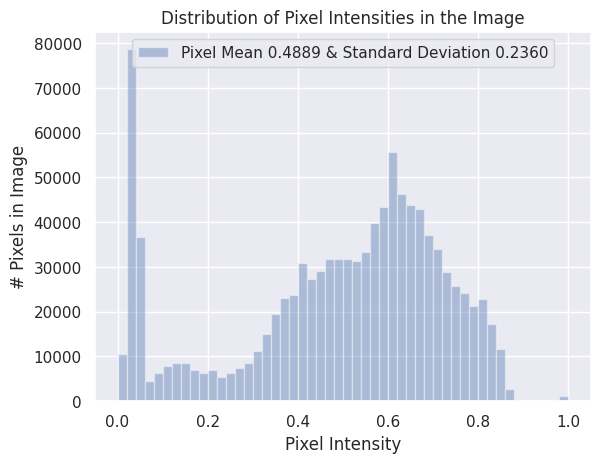

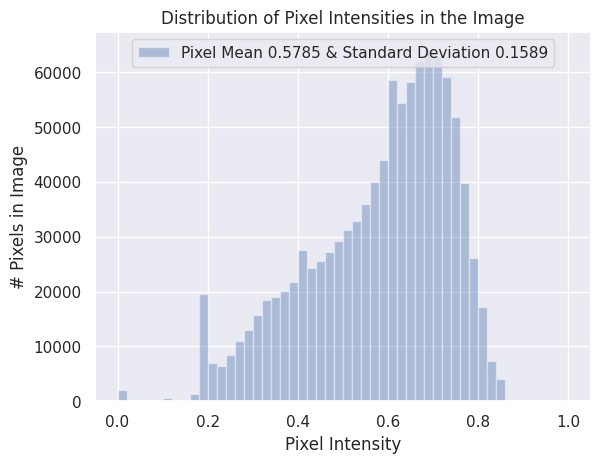

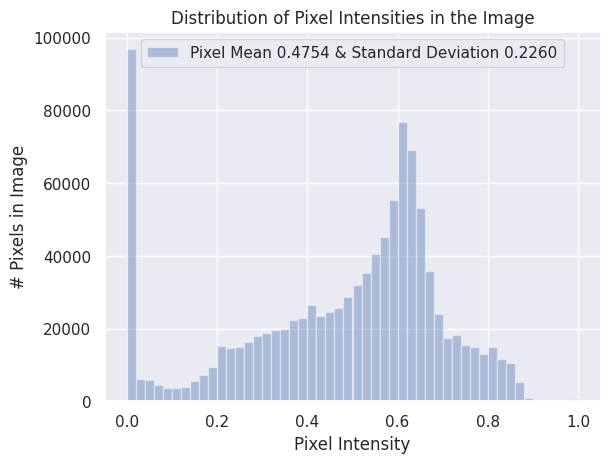

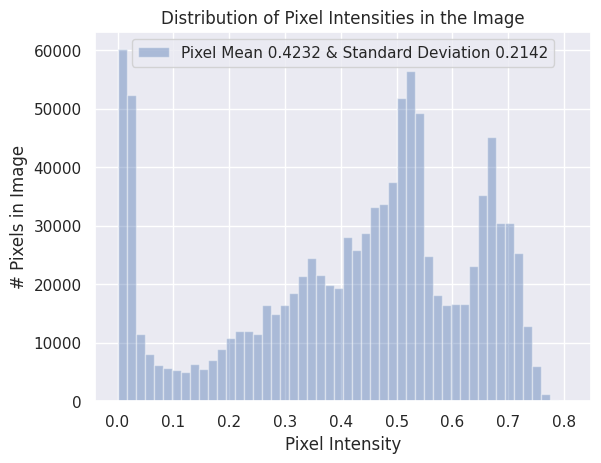

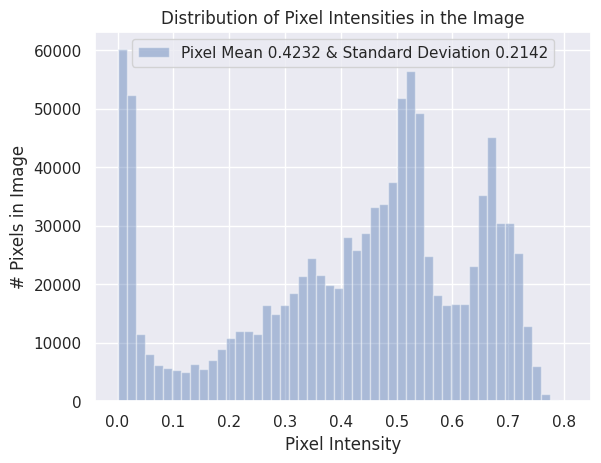

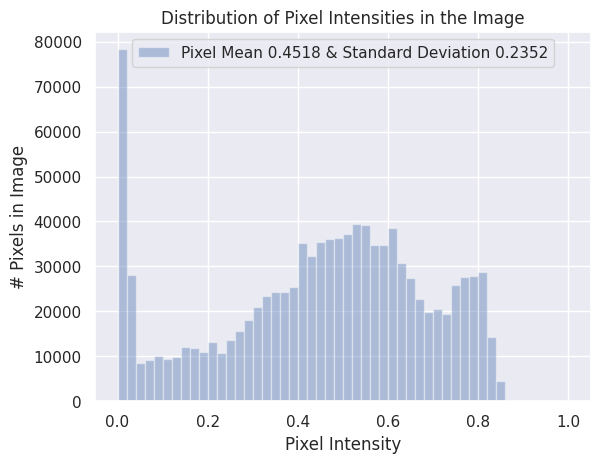

In [ ]:
#Rastgele seçtiğim 9 resim için histogram çizdiriyorum.

for i in range(9):
  sample_img = random_images[i]

  # Resmi yükle
  raw_image = plt.imread(os.path.join(img_dir, sample_img))

  sns.distplot(raw_image.ravel(),
  label=f'Pixel Mean {np.mean(raw_image):.4f} & Standard Deviation {np.std(raw_image):.4f}', kde=False)
  plt.legend(loc='upper center')
  plt.title('Distribution of Pixel Intensities in the Image')
  plt.xlabel('Pixel Intensity')
  plt.ylabel('# Pixels in Image')

    # Görselleri göster
  plt.show()

In [ ]:
pip install numpy


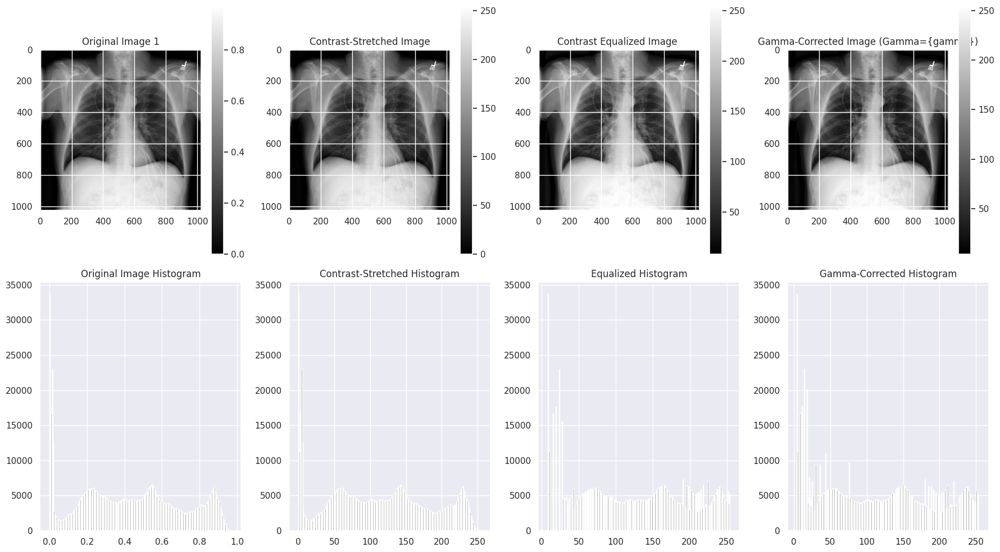

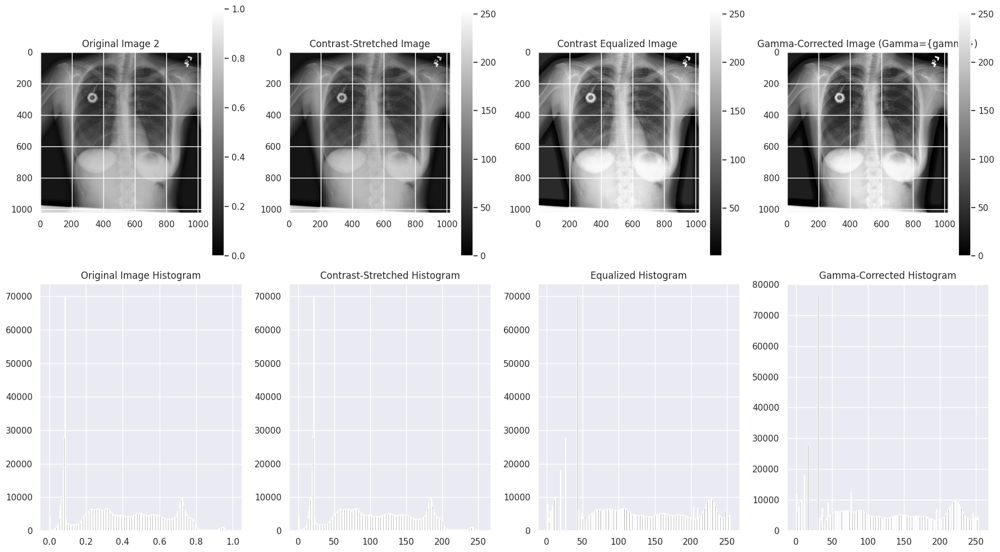

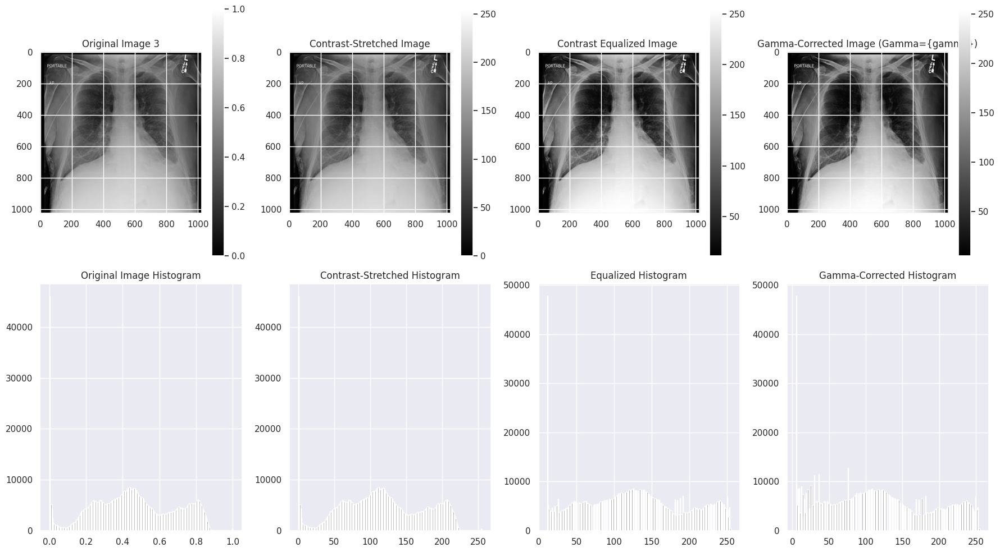

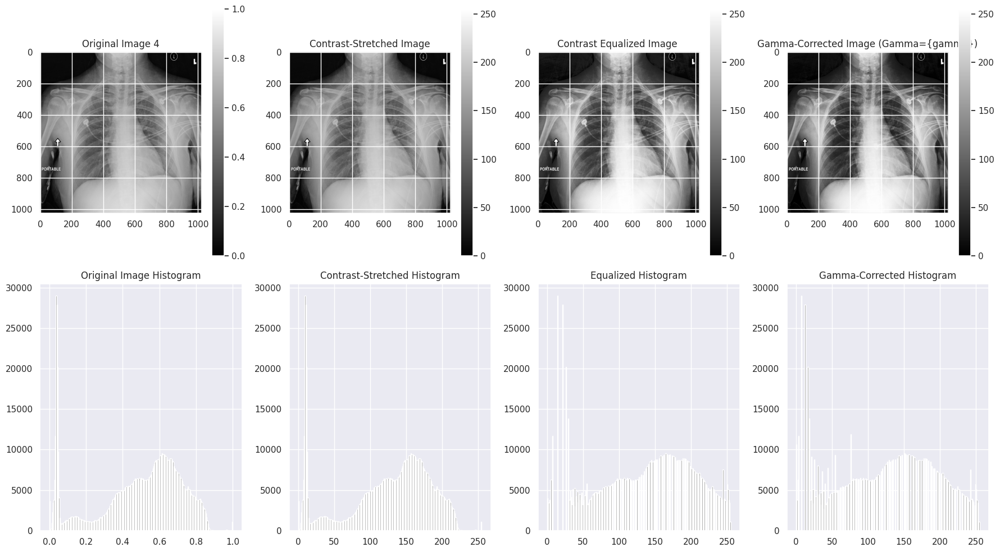

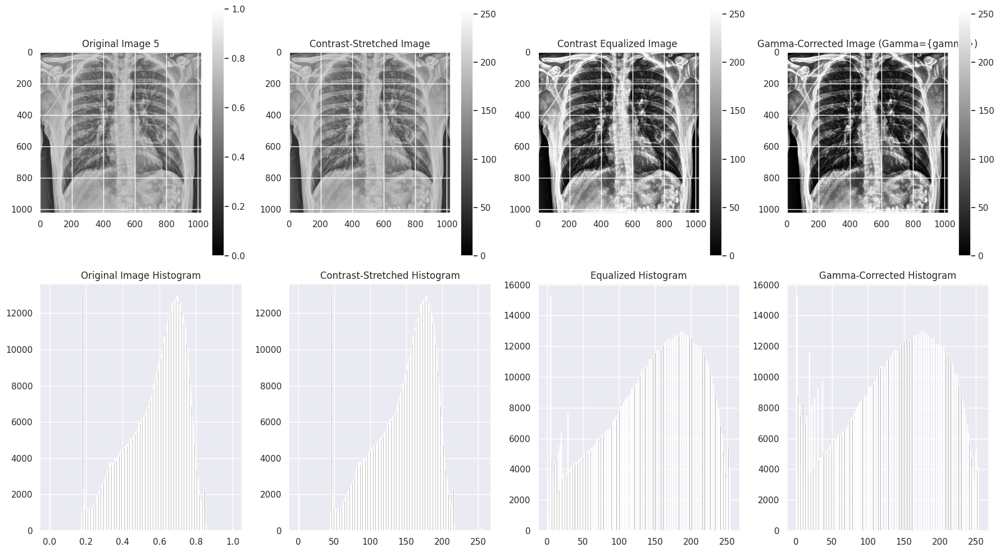

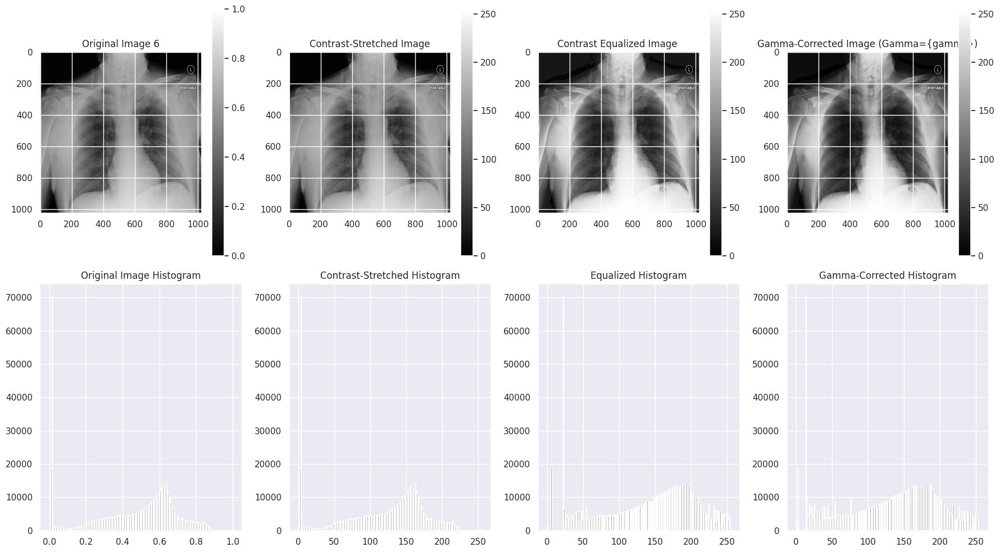

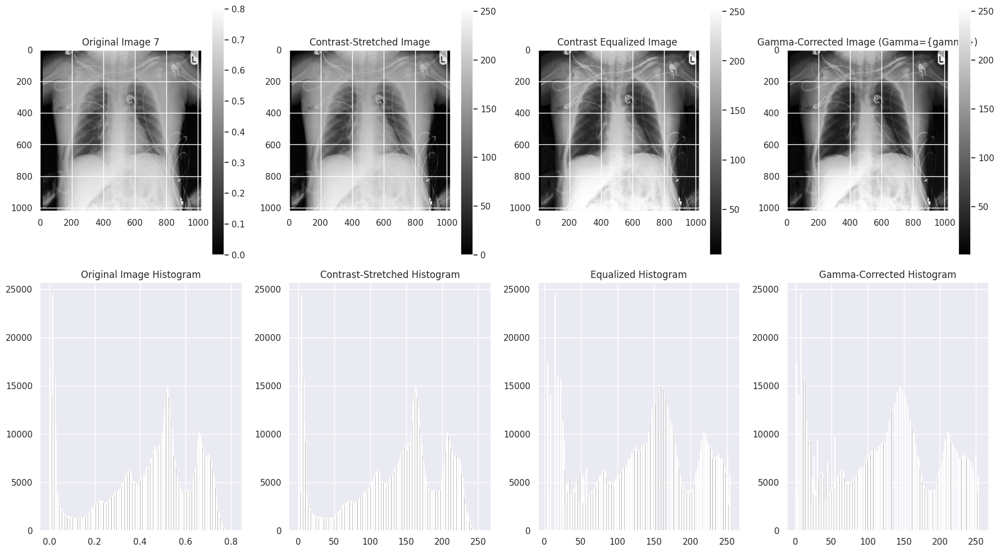

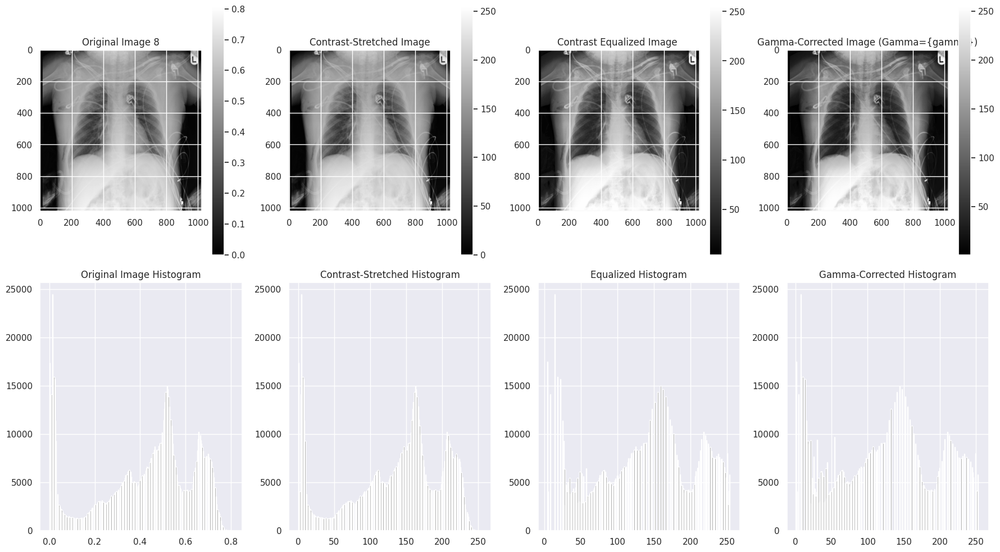

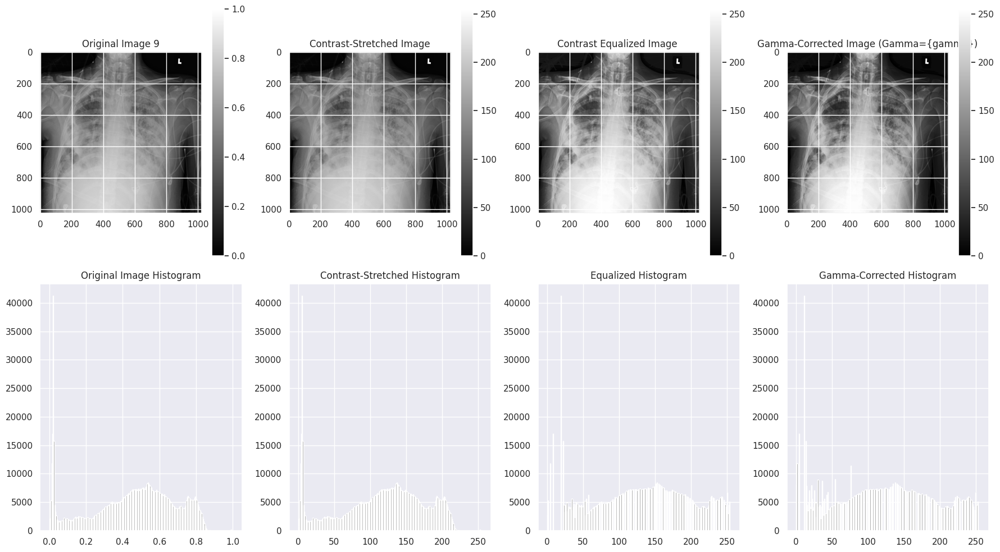

In [ ]:
#Goruntulere constrat stretching yapılarak , gamma transformasyonu uygulandı.
from skimage import exposure
for i in range(9):
  sample_img = random_images[i]

  # Resmi yükle
  raw_image = plt.imread(os.path.join(img_dir, sample_img))


  # Calculate minimum and maximum for contrast stretching
  min_val, max_val = raw_image.min(), raw_image.max()

  # Step 1: Apply contrast stretching
  min_val, max_val = raw_image.min(), raw_image.max()
  contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
  contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

  # Step 2: Apply histogram equalization after contrast stretching
  # Step 2: Apply histogram equalization using skimage
  equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
  equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]


  # Step 3: Apply gamma correction on the equalized image
  gamma = 1.2  # Adjust gamma value as needed
  gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
  gamma_corrected = gamma_corrected.astype(np.uint8)

  # Plot original image and histogram
  plt.figure(figsize=(18, 10))
  plt.subplot(2, 4, 1)
  plt.imshow(raw_image, cmap='gray')
  plt.title(f'Original Image {i+1}')
  plt.colorbar()
  plt.subplot(2, 4, 5)
  plt.hist(raw_image.ravel(), bins=256, color='gray')
  plt.title("Original Image Histogram")

  # Plot contrast-stretched image and histogram
  plt.subplot(2, 4, 2)
  plt.imshow(contrast_stretched, cmap='gray')
  plt.title('Contrast-Stretched Image')
  plt.colorbar()
  plt.subplot(2, 4, 6)
  plt.hist(contrast_stretched.ravel(), bins=256, color='gray')
  plt.title("Contrast-Stretched Histogram")

  # Plot contrast-equalized image and histogram
  plt.subplot(2, 4, 3)
  plt.imshow(equalized_image, cmap='gray')
  plt.title('Contrast Equalized Image ')
  plt.colorbar()
  plt.subplot(2, 4, 7)
  plt.hist(equalized_image.ravel(), bins=256, color='gray')
  plt.title("Equalized Histogram")

  # Plot gamma-corrected image and histogram
  plt.subplot(2, 4, 4)
  plt.imshow(gamma_corrected, cmap='gray')
  plt.title('Gamma-Corrected Image (Gamma={gamma})')
  plt.colorbar()
  plt.subplot(2, 4, 8)
  plt.hist(gamma_corrected.ravel(), bins=256, color='gray')
  plt.title("Gamma-Corrected Histogram")

  plt.tight_layout()
  plt.show()

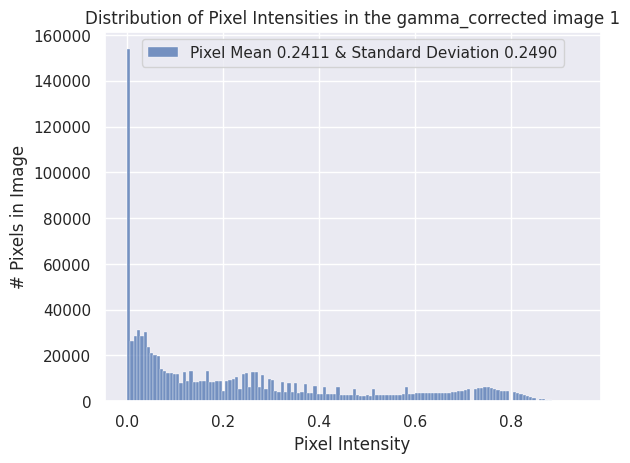

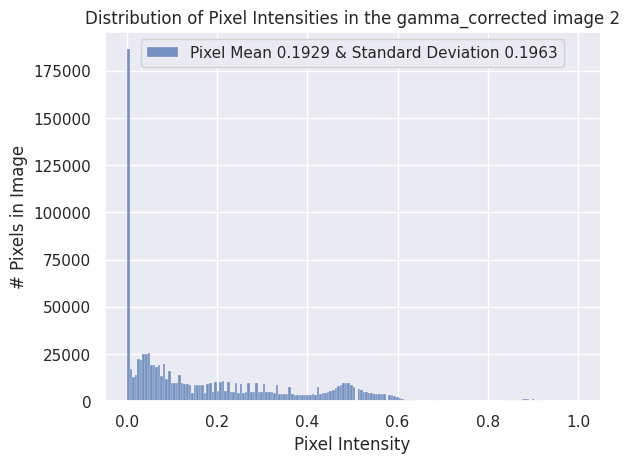

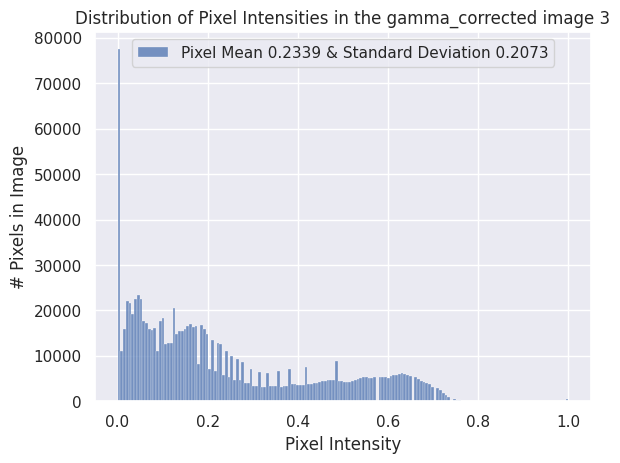

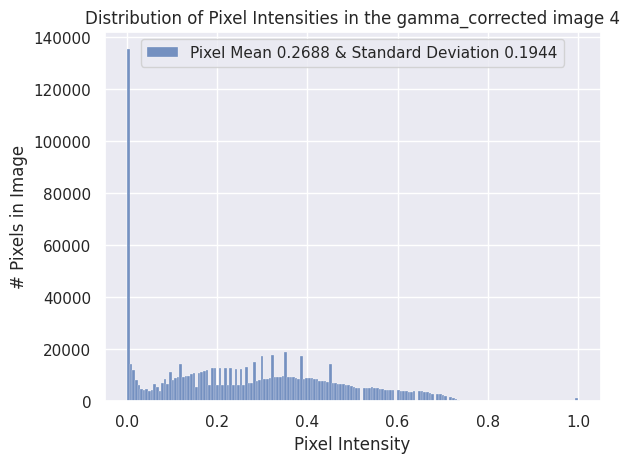

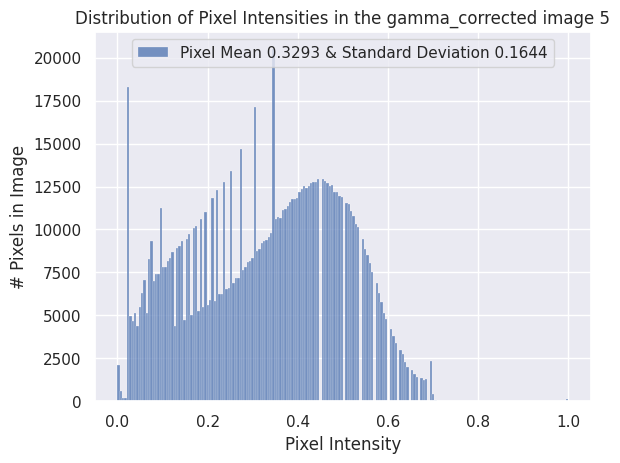

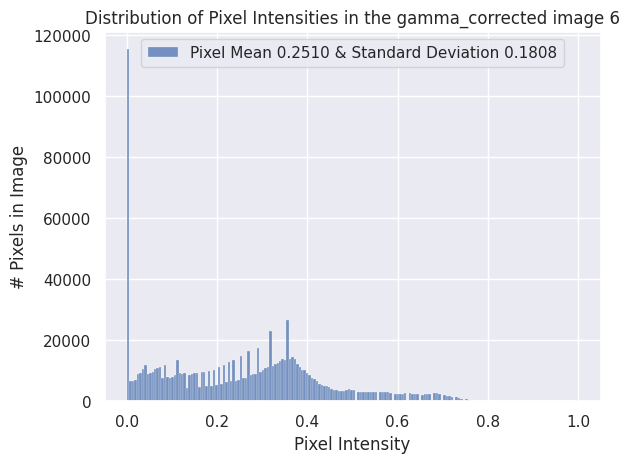

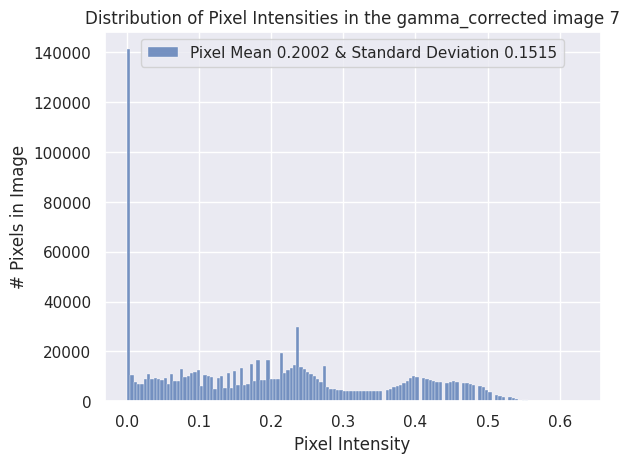

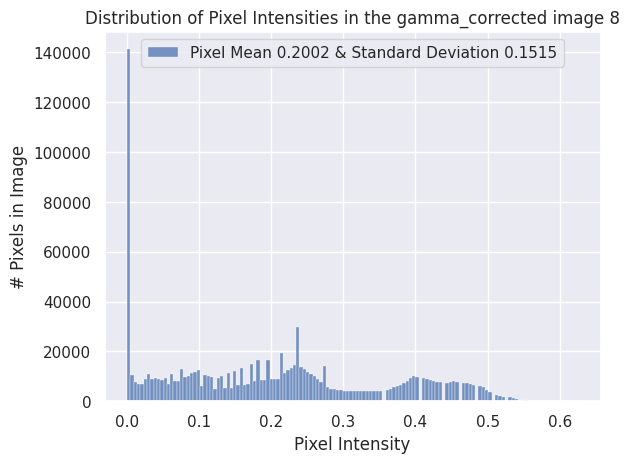

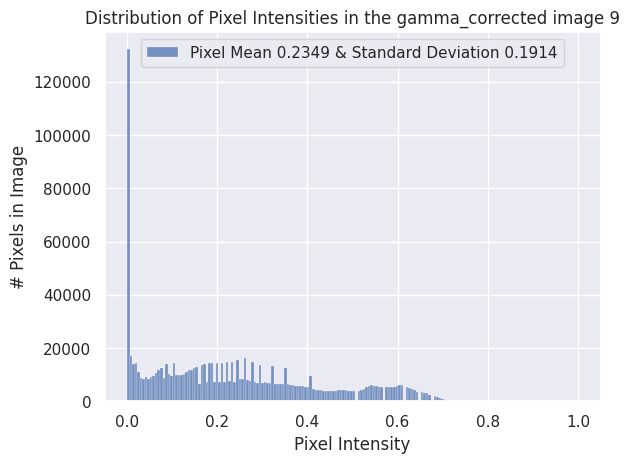

In [ ]:
# 9 kez dönecek şekilde döngü yaptım ve gamma corrected cizdirdim.

for i in range(9):
    sample_img = random_images[i]  # random_images[i] her seferinde farklı bir görüntü seçiyor

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, sample_img))

    # Gamma düzeltmesi uygulayın
    # Step 1: Apply contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Step 2: Apply histogram equalization after contrast stretching
    # Step 2: Apply histogram equalization using skimage
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]


    # Step 3: Apply gamma correction on the equalized image
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    gamma_corrected = apply_gamma_correction(raw_image)

    # Histogramı çiz
    sns.histplot(gamma_corrected.ravel(),
                 label=f'Pixel Mean {np.mean(gamma_corrected):.4f} & Standard Deviation {np.std(gamma_corrected):.4f}', kde=False)

    # Grafik özelliklerini ekleyin
    plt.legend(loc='upper center')
    plt.title(f'Distribution of Pixel Intensities in the gamma_corrected image {i+1}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('# Pixels in Image')

    # Grafiği göster
    plt.show()

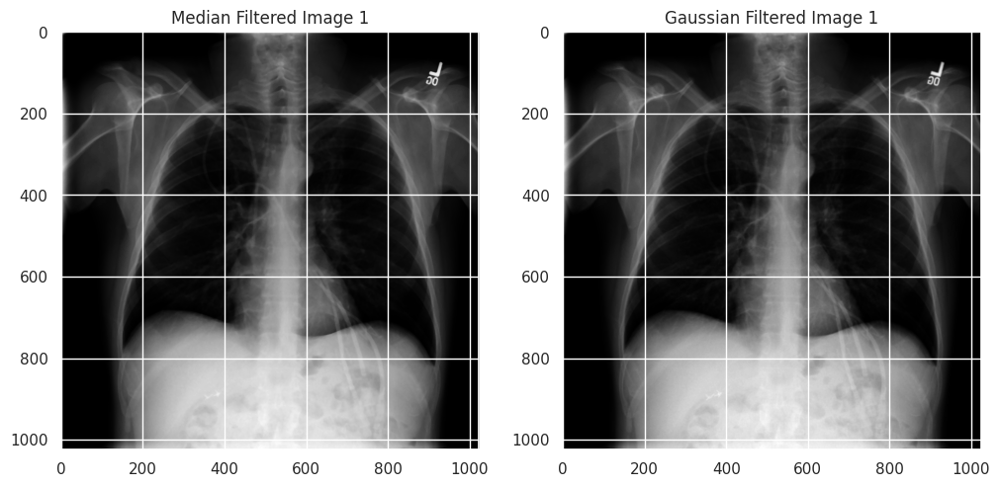

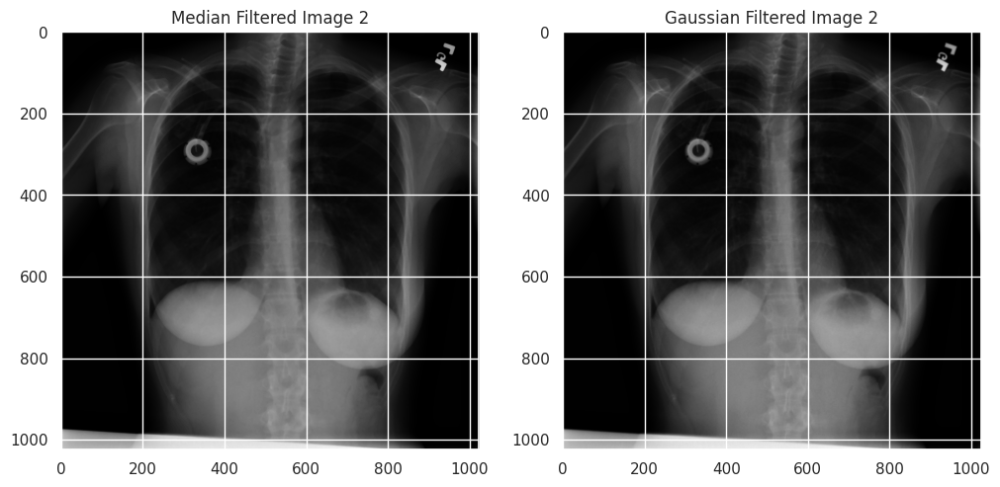

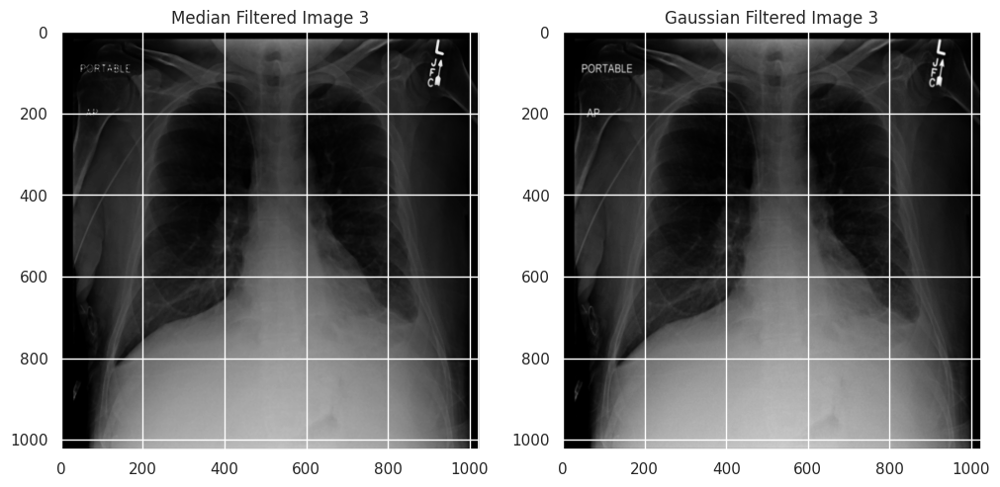

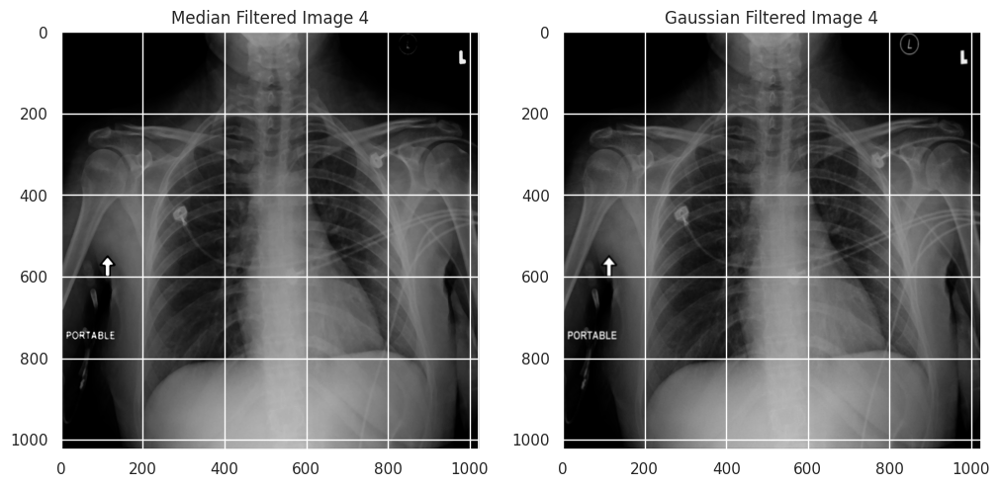

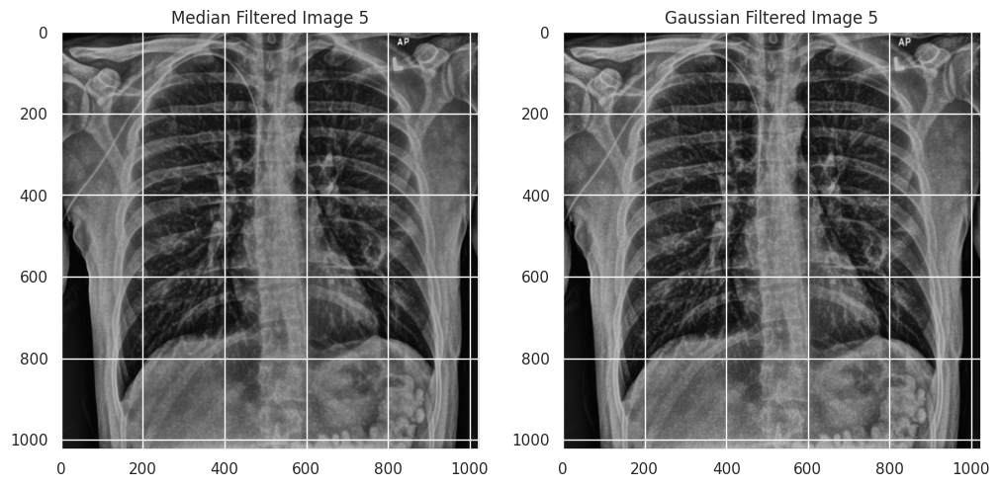

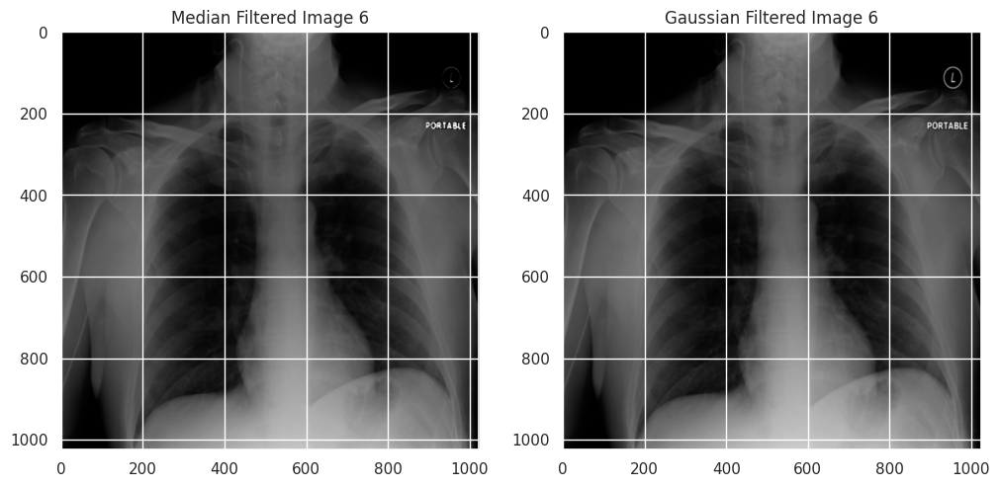

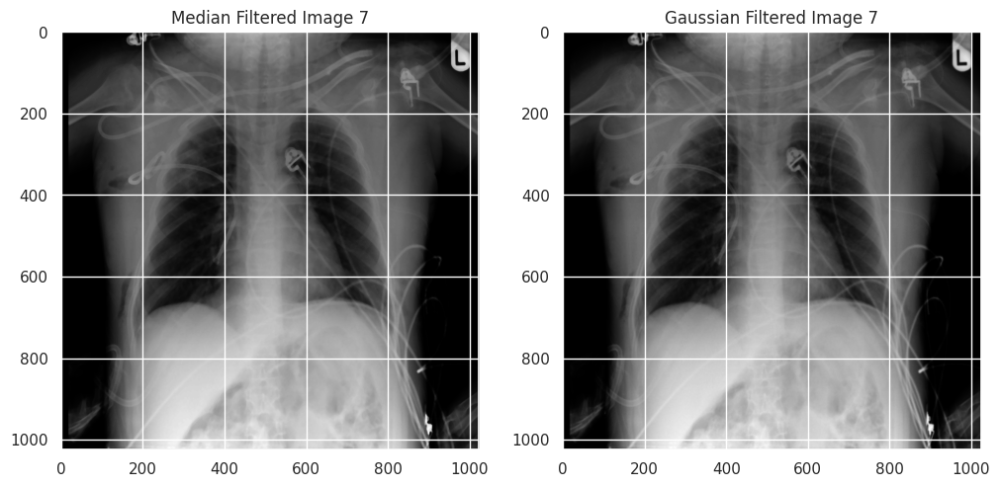

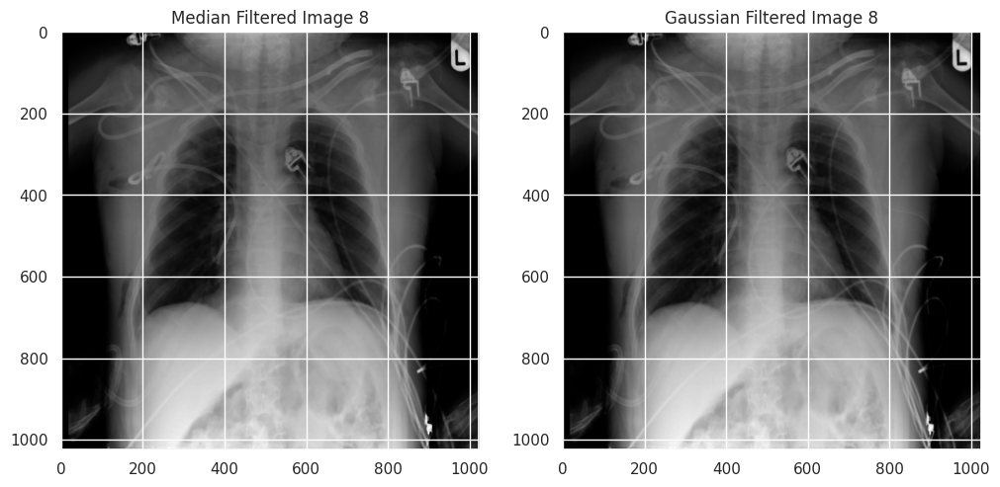

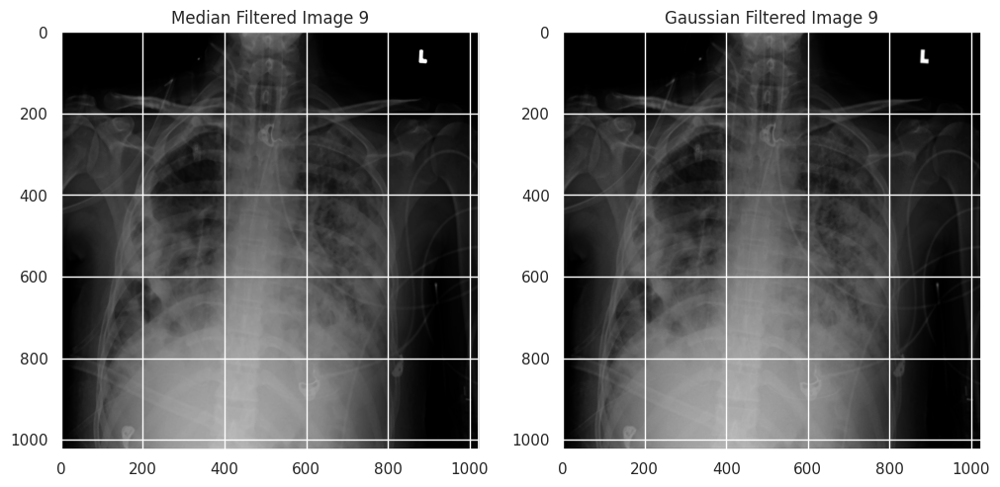

In [ ]:
#Tum görüntülere Emdian ve Gaussion blur uyguladım.

import cv2  # opencv for python package


for i in range(9):
    sample_img = random_images[i]  # random_images[i] her seferinde farklı bir görüntü seçiyor

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, sample_img))




    # Gamma düzeltmesi uygula (örneğin, bir gamma düzeltmesi fonksiyonu kullanabilirsiniz)
    gamma_corrected = np.power(raw_image, 2.2)  # Varsayalım ki gamma = 2.2

    # Uygulama: Median Filtering
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # Uygulama: Gaussian Filtering
    gaussian_filtered = cv2.GaussianBlur(gamma_corrected, (5, 5), 0)

    # Sonuçları göster
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f"Median Filtered Image {i+1}")

    plt.subplot(1, 2, 2)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title(f"Gaussian Filtered Image {i+1}")

    # Görüntüleri göster
    plt.show()

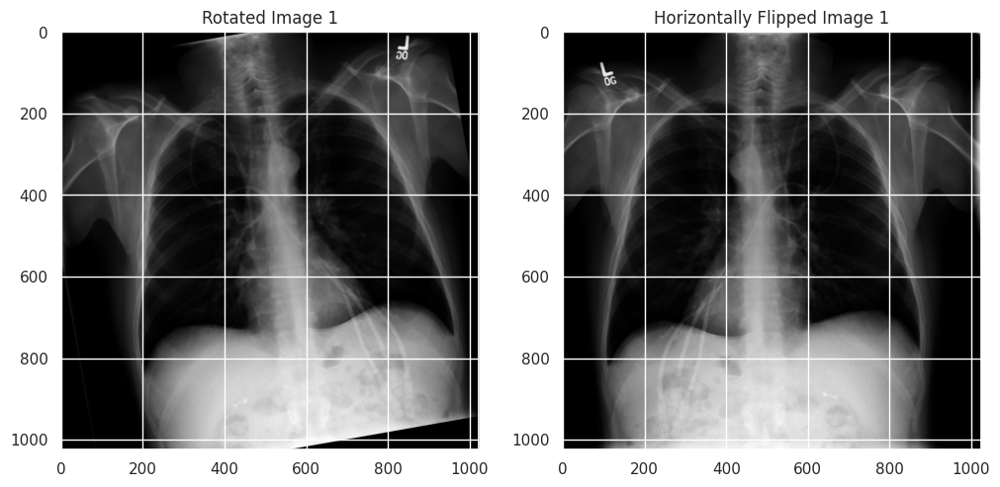

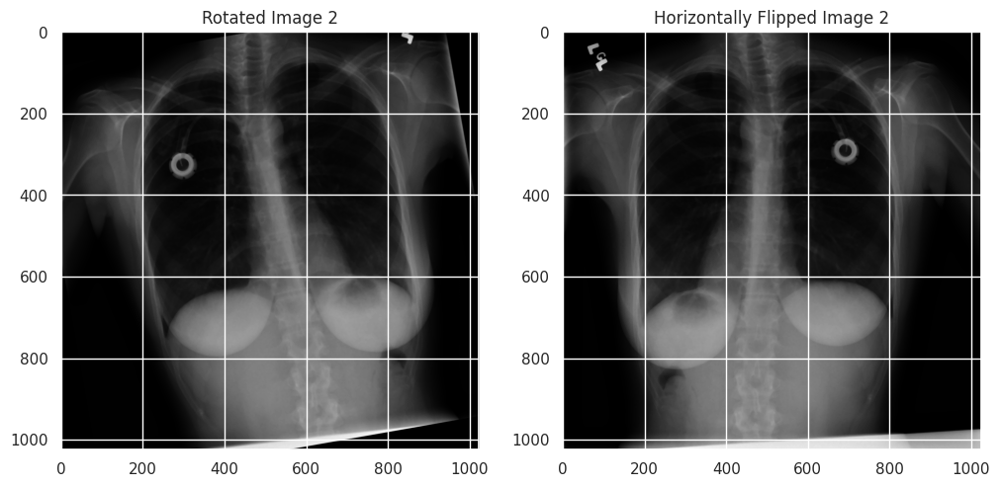

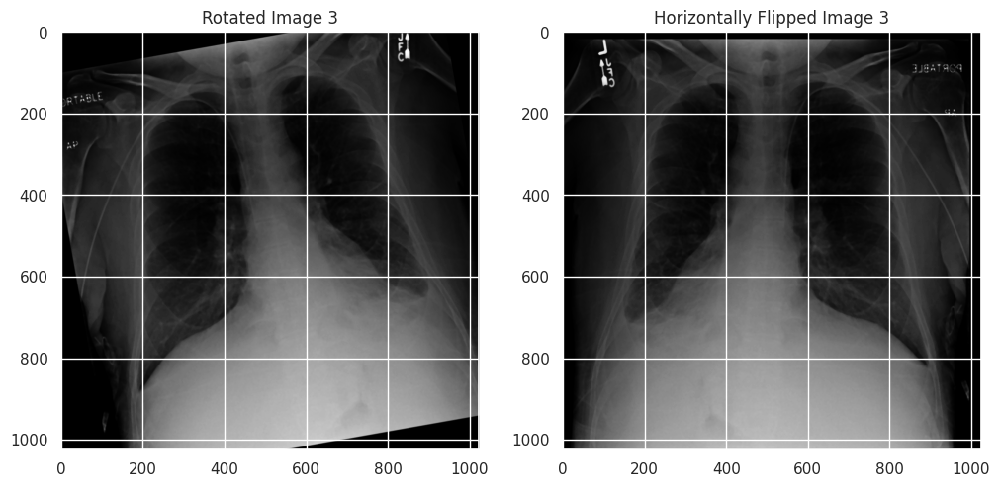

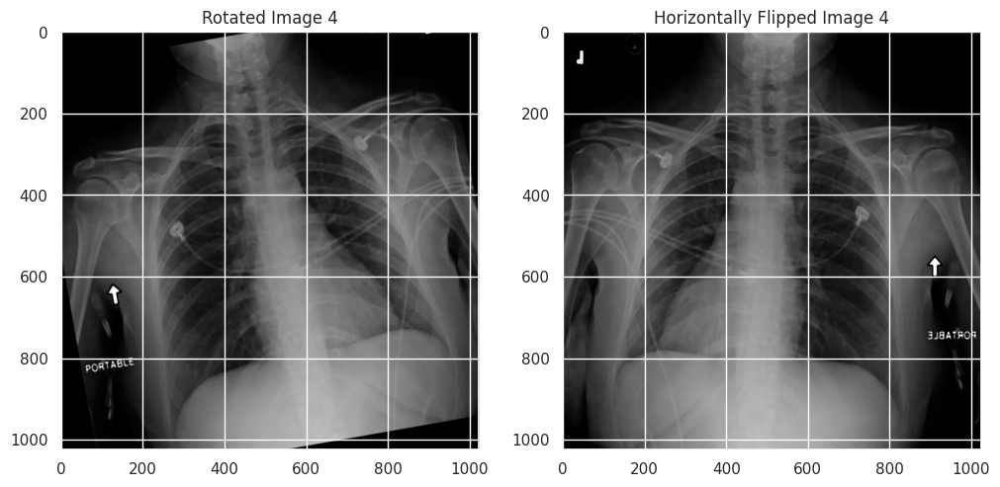

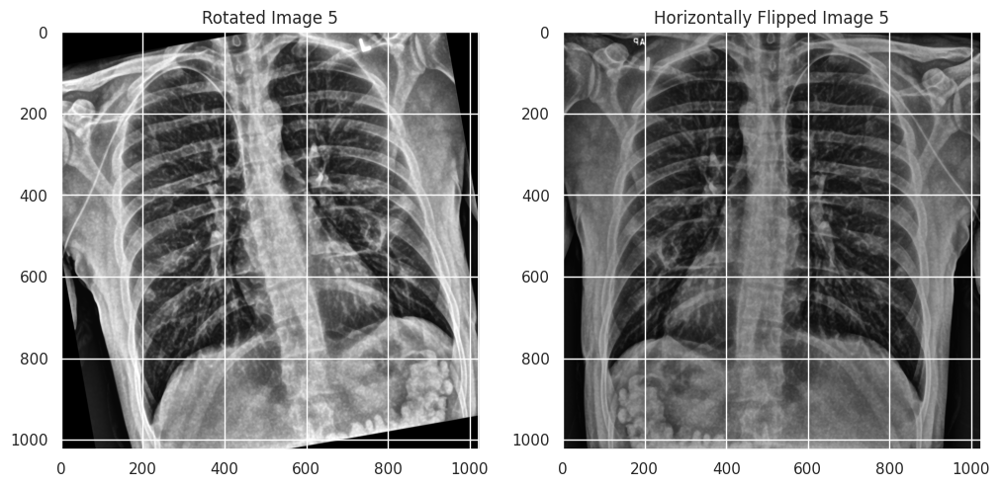

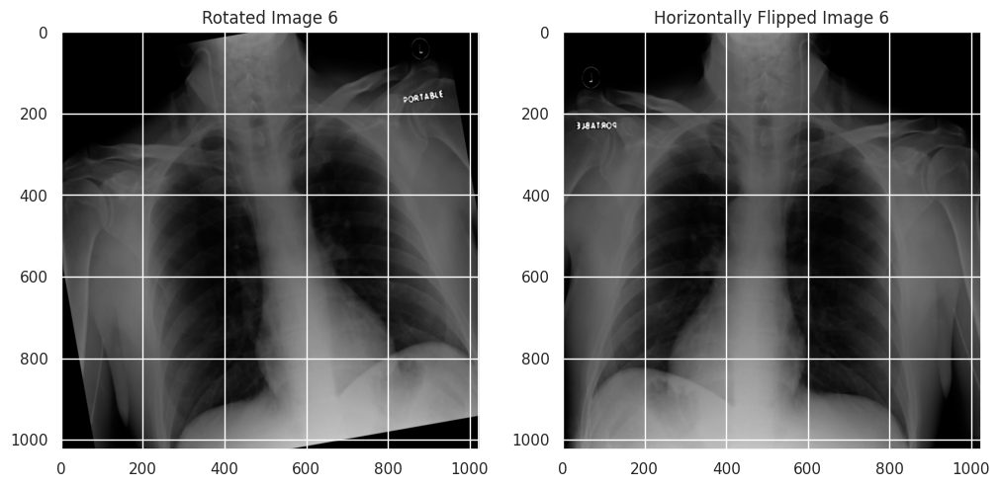

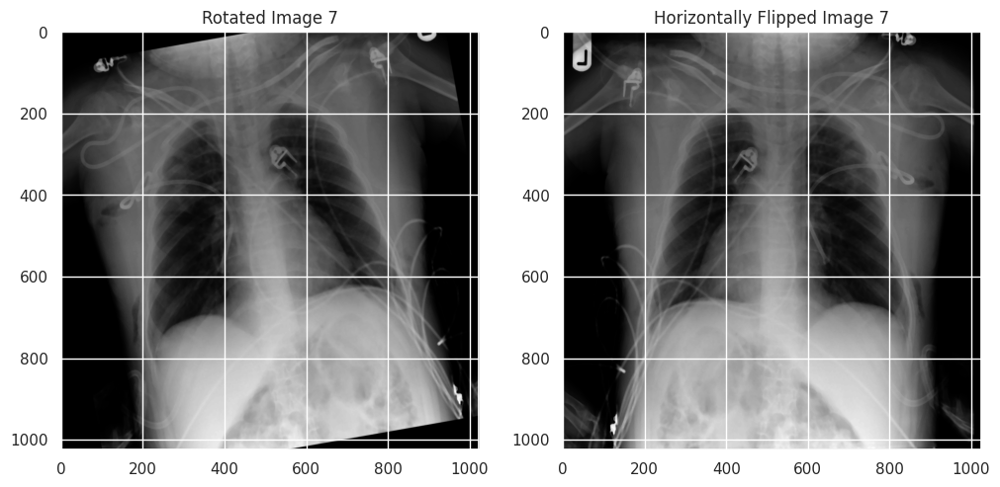

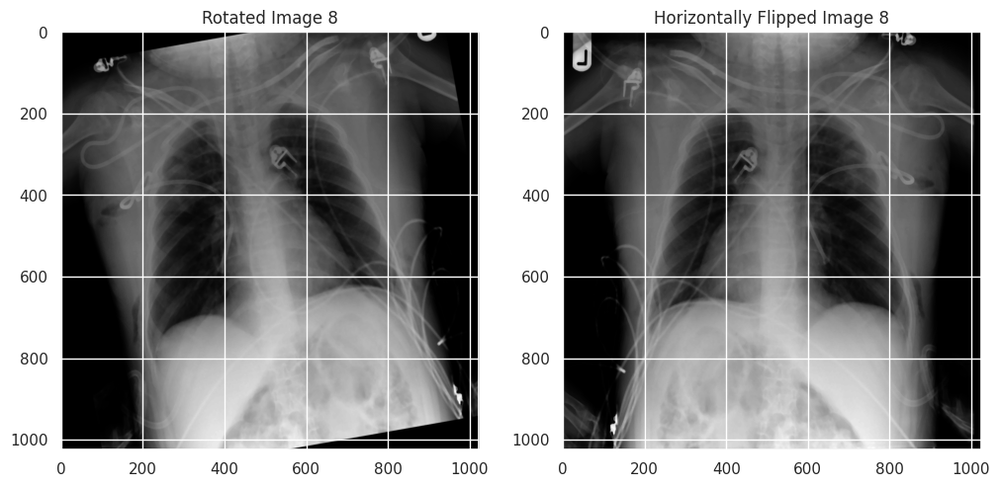

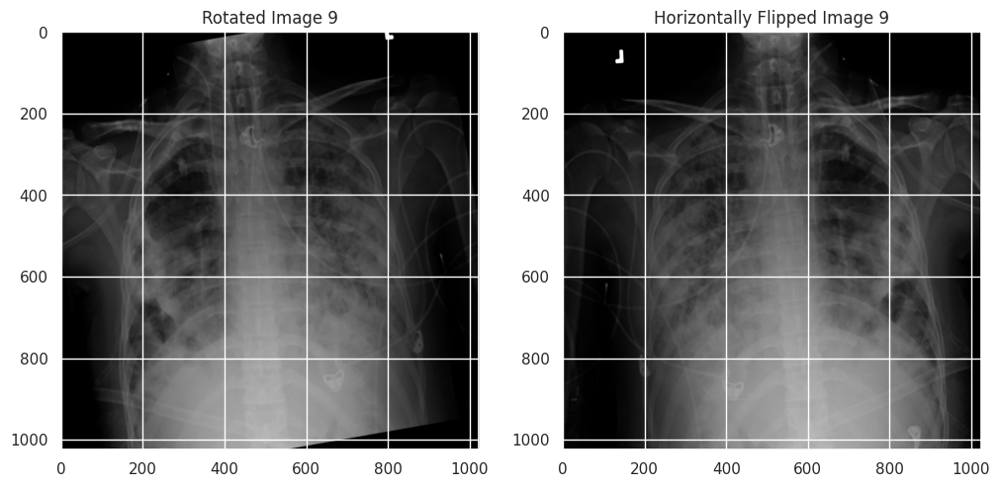

In [ ]:
# Tüm görüntülere 10 derecelik rotatation - flip uyguladım.

for i in range(9):
  sample_img = random_images[i]  # random_images[i] her seferinde farklı bir görüntü seçiyor

  # Resmi yükle
  raw_image = plt.imread(os.path.join(img_dir, sample_img))

  # Gamma düzeltmesi uygula (örneğin, bir gamma düzeltmesi fonksiyonu kullanabilirsiniz)
  gamma_corrected = np.power(raw_image, 2.2)  # Varsayalım ki gamma = 2.2

  # Uygulama: Median Filtering
  median_filtered = cv2.medianBlur(gamma_corrected, 5)

# Example: Rotate the image by 10 degrees
  center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
  rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
  rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

  # Horizontal Flip
  flipped_horizontal = cv2.flip(median_filtered, 1)

  # Display Results
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
  plt.subplot(1, 2, 2), plt.imshow(flipped_horizontal, cmap='gray'), plt.title(f"Horizontally Flipped Image {i+1}")
  plt.show()


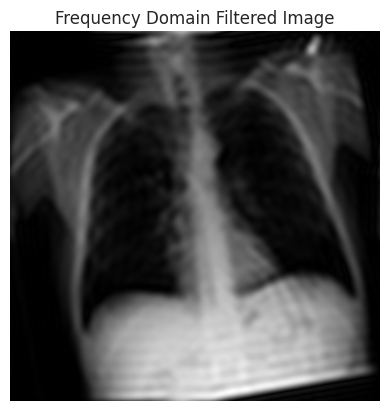

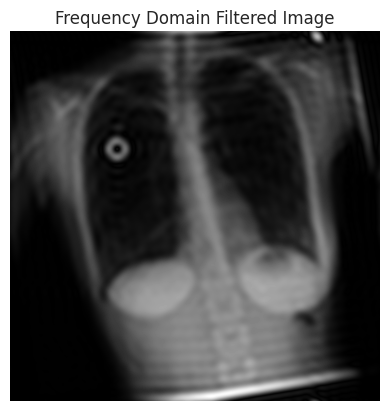

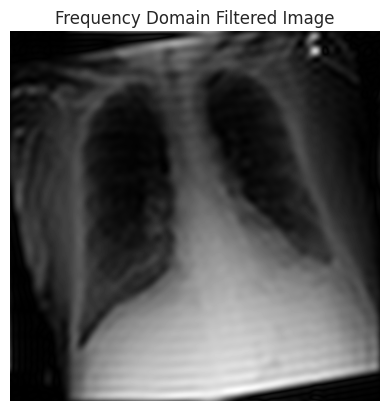

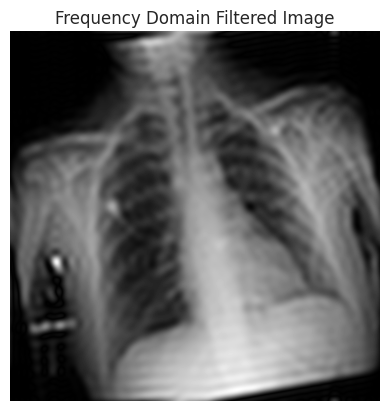

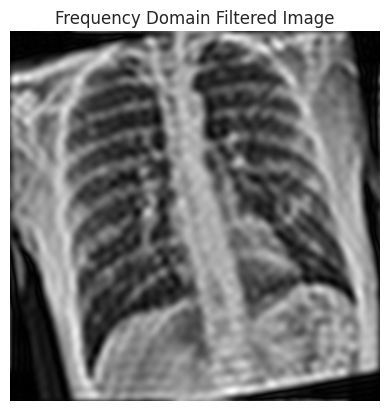

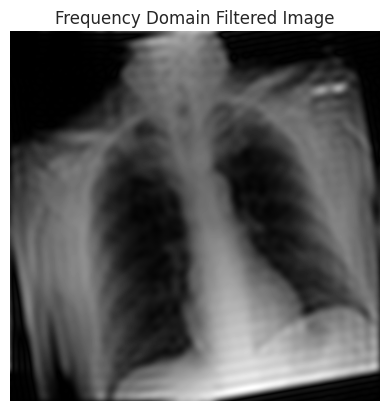

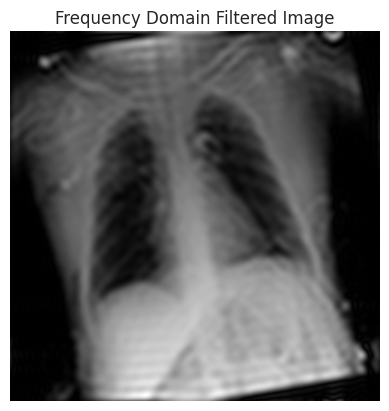

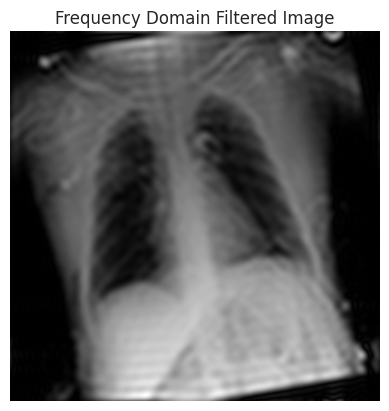

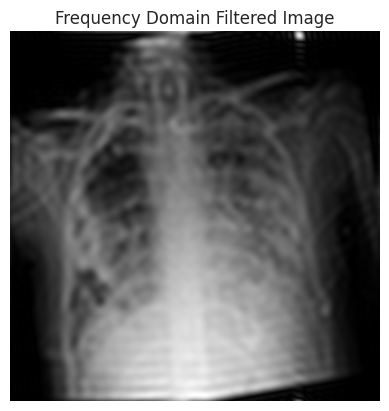

In [ ]:
#Fourier dönüşümü ile görüntüyü frekans alanına çevirdim, düşük frekansları geçiren bir maske uyguladım, ardından ters Fourier dönüşümü ile frekans alanında filtreleme yaptım.

# 9 kez dönecek şekilde döngü
for i in range(9):
    sample_img = random_images[i]  # random_images[i] her seferinde farklı bir görüntü seçiyor

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, sample_img))

    # Gamma düzeltmesi uygula (örneğin, bir gamma düzeltmesi fonksiyonu kullanabilirsiniz)
    gamma_corrected = np.power(raw_image, 2.2)  # Varsayalım ki gamma = 2.2

    # Uygulama: Median Filtering
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # Rotate the image by 10 degrees
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))


    # Apply Fourier Transform and shift it to center low frequencies
    dft = cv2.dft(np.float32(rotated_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)

    # Create a mask for filtering
    rows, cols = rotated_image.shape
    crow, ccol = rows // 2 , cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1  # Center low frequencies pass

    # Apply mask and inverse DFT
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Normalize and display the filtered image
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)
    plt.imshow(filtered_image, cmap='gray')
    plt.title("Frequency Domain Filtered Image")
    plt.axis("off")
    plt.show()


<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

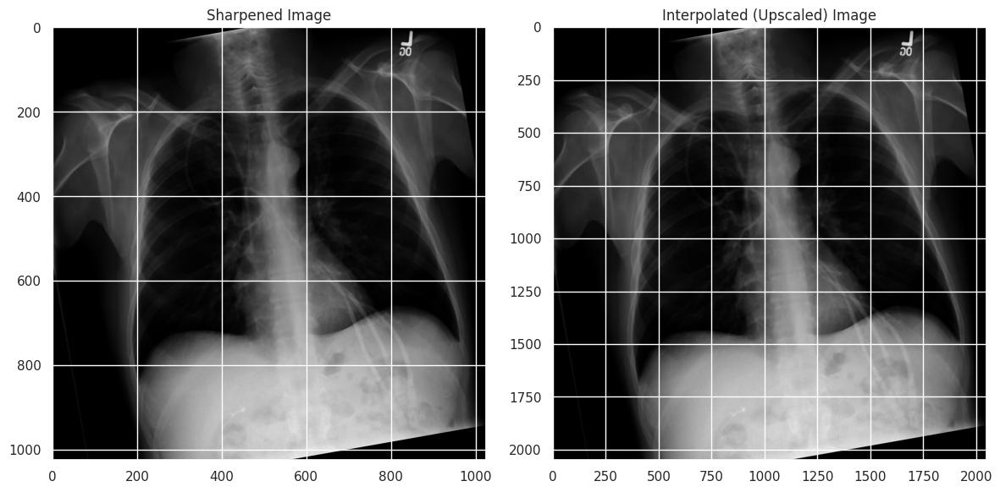

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

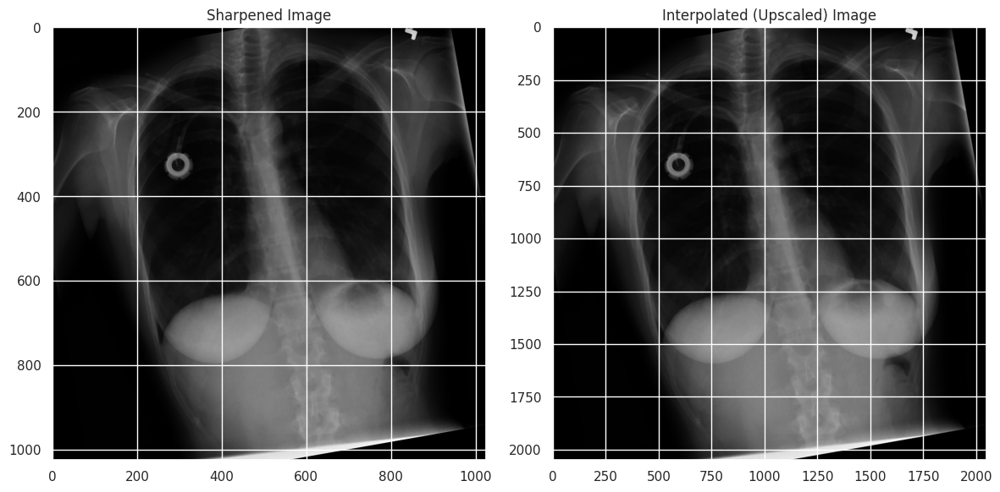

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

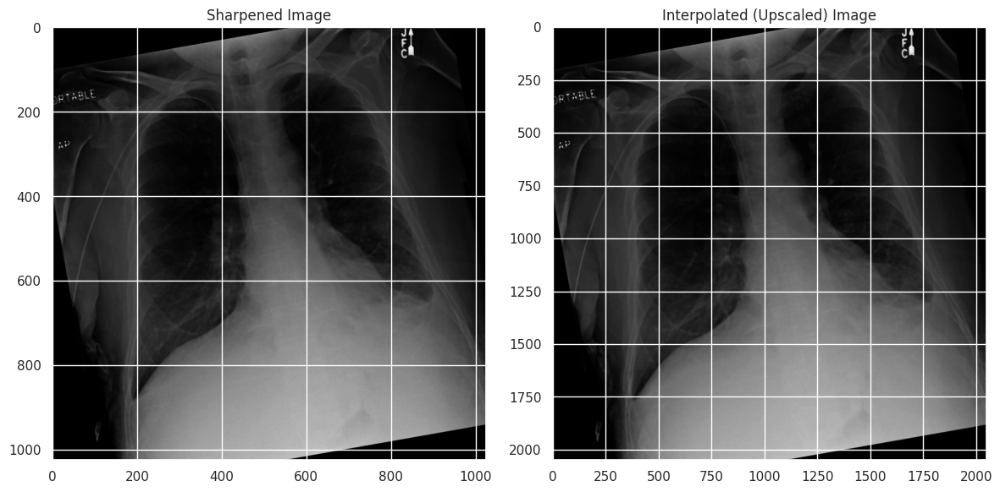

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

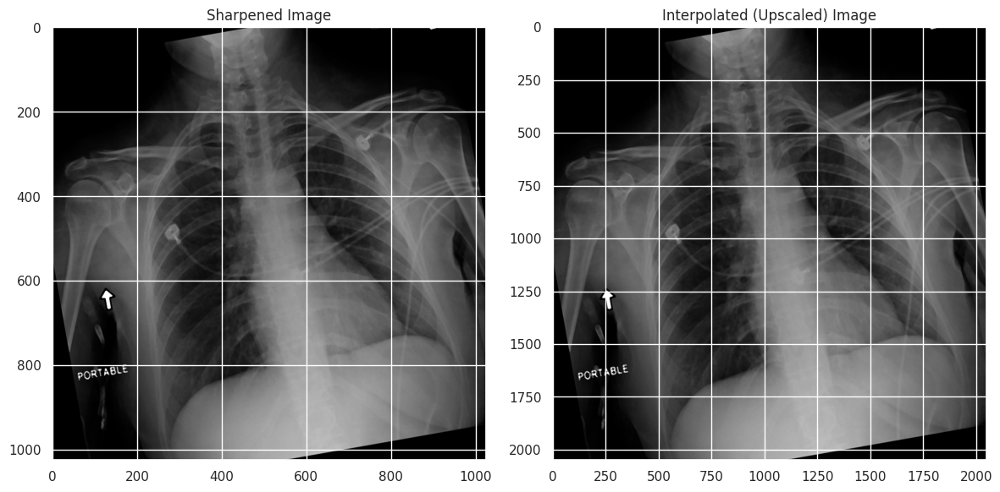

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

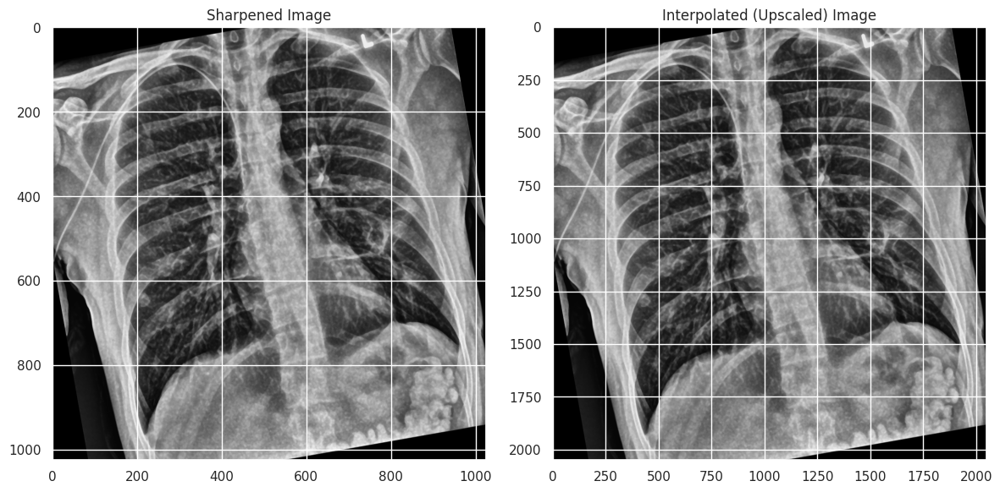

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

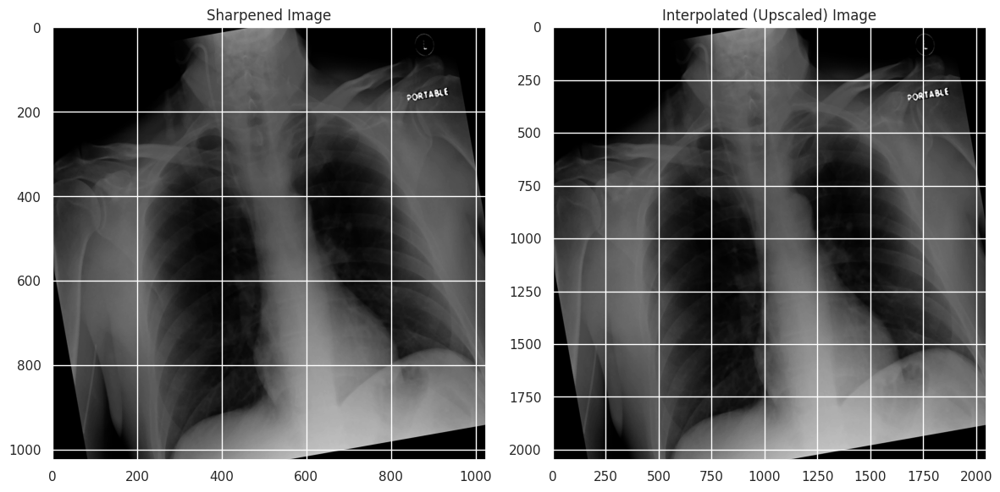

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

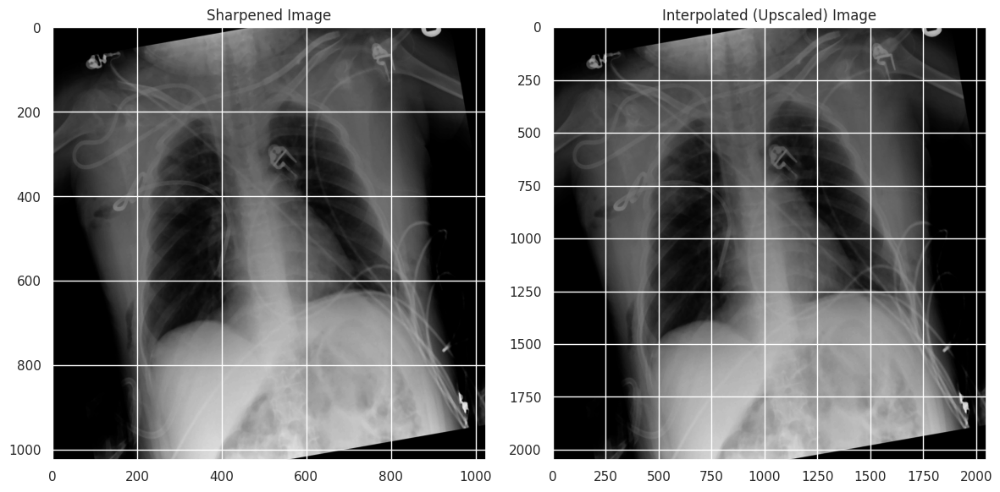

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

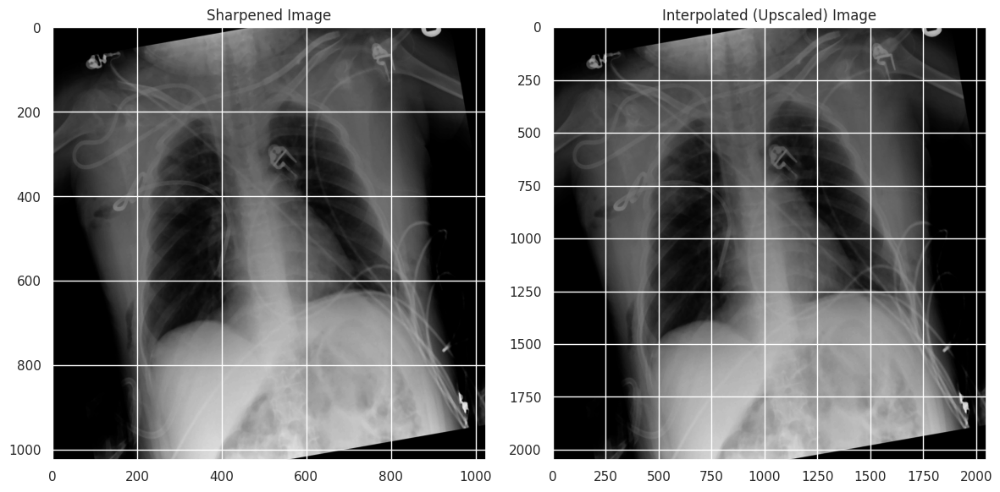

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

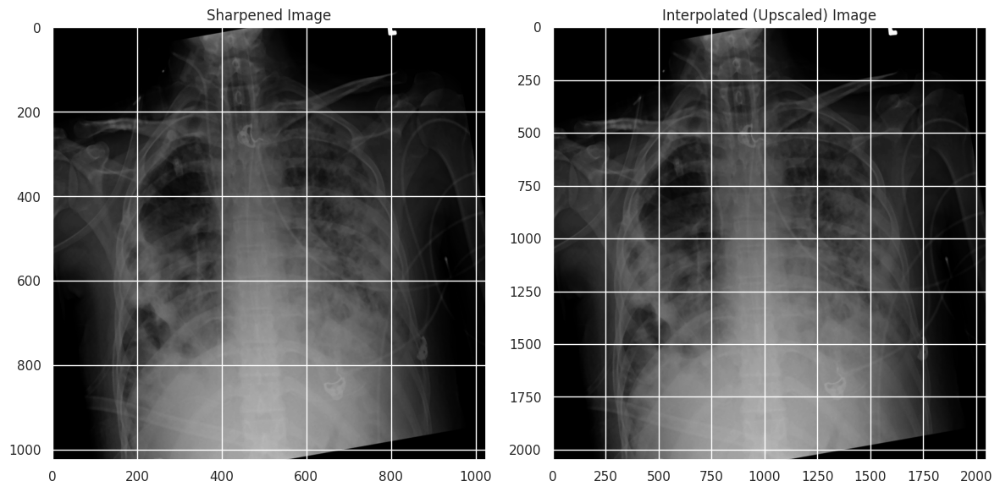

In [ ]:
# Keskinleştirilmiş görüntüyü iki kat büyüterek enterpolasyon uyguladım.
# Döngü: 9 kez dönecek

from scipy.ndimage import zoom
for i in range(9):
    sample_img = random_images[i]  # random_images[i] her seferinde farklı bir görüntü seçiyor

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, sample_img))

    # Gamma düzeltmesi uygula (örneğin, bir gamma düzeltmesi fonksiyonu kullanabilirsiniz)
    gamma_corrected = np.power(raw_image, 2.2)  # Varsayalım ki gamma = 2.2

    # Uygulama: Median Filtering
    median_filtered = cv2.medianBlur((gamma_corrected * 255).astype(np.uint8), 5)

    # Rotate the image by 10 degrees
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))


    # 1. Adım: Gaussian Blur ile bulanıklaştırma
    blurred_image = cv2.GaussianBlur(rotated_image, (5, 5), 1.0)  # 5x5 kernel ile
    # 2. Adım: Orijinal görüntü ile bulanıklaştırılmış görüntüyü çıkarma
    sharpened_image = cv2.addWeighted(rotated_image, 1.5, blurred_image, -0.5, 0)
    # 3. Adım: Görüntüyü keskinleştirme

    scale_factor = 2
    resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation with `order=3`

    plt.figure(figsize=(12, 6))

    # **Interpolasyon Uygulama (Bicubic Interpolation ile Büyütme)**:
    scale_factor = 2  # İki kat büyütme
    upscaled_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation ile büyütme

    # Görüntüleri Görselleştirme
    plt.figure(figsize=(12, 6))

        # Step 5: Apply bicubic interpolation to upscale the image by a factor of 2
    scale_factor = 2
    resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation with `order=3`

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1), plt.imshow(sharpened_image, cmap='gray'),plt.title("Sharpened Image")
    plt.subplot(1, 2, 2), plt.imshow(resized_image, cmap='gray'),plt.title("Interpolated (Upscaled) Image")


    plt.tight_layout()
    plt.show()
